In [1]:
import logging
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt

In [2]:
from pyobsbox import Checker

In [3]:
logging.getLogger("pyobsbox").setLevel(logging.WARNING)
logging.getLogger("pyobsbox.plotter").setLevel(logging.DEBUG)

# List models

In [4]:
models_folder = Path("../../models")

In [5]:
[model.name for model in list(models_folder.glob('model_*'))]

['model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_abs_diff_seed_42',
 'model_dense_512_128_32_8_B1H_Inst_center_scale_100_seed_42',
 'model_conv_64_32_16_8_stride_4_B1H_Inst_znorm_seed_42',
 'model_time_dist_32_16_B1H_Inst_500',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_stride_4_B1H_Inst',
 'model_conv_32_16_stride_4_B1H_Inst_jorg',
 'model_conv_max_pool_64_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_1000_seed_42',
 'model_conv_64_32_16_8_stride_4_noDO_decode_B1H_Inst_min_max_rolling_avg_std_window_2049_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_10000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_1000_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_center_scale_100_seed_42',
 'model_conv_32_16_8_stride_4_B1H_Inst_presplit_znorm_seed_42',
 'model_conv_32

In [6]:
model_path = models_folder / "model_conv_64_32_16_8_4_stride_4_noDO_decode_B1H_Inst_min_max_rolling_avg_std_window_129_seed_42"

In [7]:
checker = Checker(model_path)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 512, 64)           960       
_________________________________________________________________
dropout (Dropout)            (None, 512, 64)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 128, 32)           14368     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128, 32)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 32, 16)            3600      
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 16)            0         
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 8, 8)              9

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

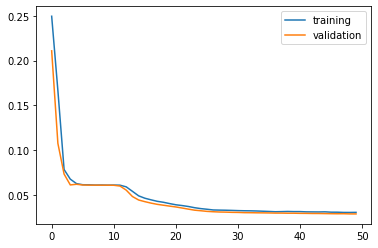

In [8]:
checker.plot_loss()

In [9]:
train_data, train_meta = checker.load_train_dataset()
train_prediction = checker.predict(train_data)


50/50 [==============================] - 111s 2s/step


In [10]:
train_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
585,Inst,6364,1,h,7,2017-11-06 02:13:19,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6364/...,300,416.0,217.0,65536,2
890,Inst,6606,1,h,7,2018-04-24 01:55:08,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6606/...,1164,532.0,370.0,65536,3
7130,Inst,6890,1,h,7,2018-07-06 02:09:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6890/...,1452,190.0,66.0,65536,27
6539,Inst,7464,1,h,7,2018-11-22 02:56:32,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7464/...,418,3173.0,398.0,65536,25
2465,Inst,6245,1,h,7,2017-09-26 23:06:15,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6245/...,1916,996.0,544.0,65536,9


In [11]:
train_meta.shape

(396800, 12)

In [12]:
train_data.shape

(396800, 2048, 2)

In [13]:
train_prediction.shape

(396800, 2048, 2)

In [14]:
validation_data, validation_meta = checker.load_validation_dataset()
validation_prediction = checker.predict(validation_data)


5/5 [==============================] - 12s 2s/step


In [15]:
validation_meta.head()

,type,fill,beam,plane,q,date_time,file,n_bunches,bunch_index,bunch_number,ts_length,chunk
4808,Inst,7253,1,h,7,2018-10-03 17:39:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7253/...,2556,3102.0,2304.0,65536,18
1244,Inst,6919,1,h,7,2018-07-13 16:11:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6919/...,2556,2555.0,1885.0,65536,4
5767,Inst,6890,1,h,7,2018-07-05 23:24:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6890/...,1452,2598.0,1099.0,65536,22
7206,Inst,6688,1,h,7,2018-05-15 22:33:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6688/...,987,2236.0,608.0,65536,28
7624,Inst,7253,1,h,7,2018-10-03 17:39:14,/nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7253/...,2556,3102.0,2304.0,65536,29


In [16]:
validation_meta.shape

(39680, 12)

In [17]:
validation_data.shape

(39680, 2048, 2)

In [18]:
validation_prediction.shape

(39680, 2048, 2)

In [19]:
def plot_train_index(index: int):
    """Helper function to plot a sample from the train dataset.
    """
    true_signal = train_data[index]
    predicted_signal = train_prediction[index]
    metadata_row = train_meta.iloc[index]
    print(f"index: {index}")
    print(f"Error: {train_error[index]}")
    print(metadata_row)
    checker.plot_sample(metadata_row, true_signal, predicted_signal)
    plt.show()
    encoded = checker.encode(true_signal)
    plt.imshow(encoded)
    plt.show()

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

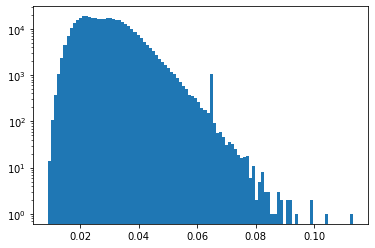

In [20]:
train_error = checker.MSE(train_data, train_prediction)
checker.plot_error(train_error, bins=100)

(<Figure size 432x288 with 1 Axes>, <AxesSubplot:>)

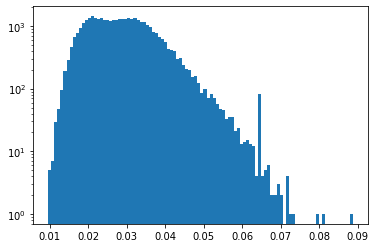

In [21]:
validation_error = checker.MSE(validation_data, validation_prediction)
checker.plot_error(validation_error, bins=100)

In [22]:
# Histogram peak
hist, bins = np.histogram(train_error, bins=100)
hist_peak = bins[np.argmax(hist)]

index: 0
Error: 0.04872775268318706
type                                                         Inst
fill                                                         6364
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-06 02:13:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6364/...
n_bunches                                                     300
bunch_index                                                   416
bunch_number                                                  217
ts_length                                                   65536
chunk                                                           2
Name: 585, dtype: object


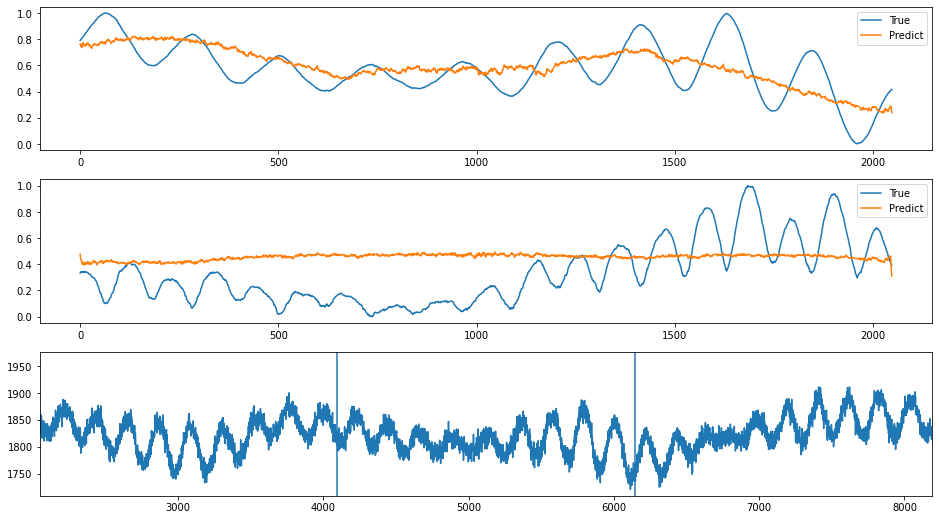

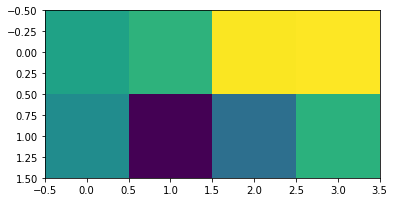

In [23]:
# plotting a random sample
plot_train_index(0)

In [24]:
sorted_error_indices = np.argsort(train_error)

# From left to right

index: 179990
Error: 0.009125033351863633
type                                                         Inst
fill                                                         7483
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-29 06:24:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7483/...
n_bunches                                                     648
bunch_index                                                  2810
bunch_number                                                  525
ts_length                                                   65536
chunk                                                          27
Name: 7127, dtype: object


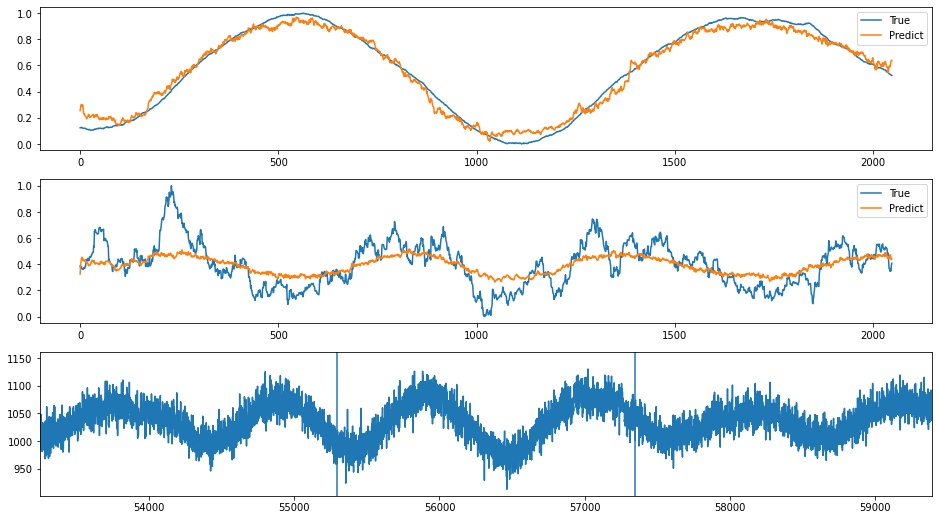

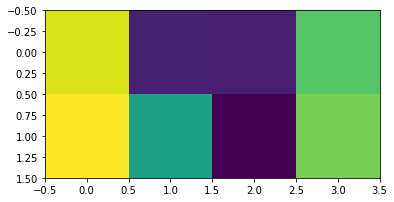

index: 278119
Error: 0.009261963196534651
type                                                         Inst
fill                                                         6370
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-09 10:19:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6370/...
n_bunches                                                    1868
bunch_index                                                   769
bunch_number                                                  424
ts_length                                                   65536
chunk                                                          15
Name: 3874, dtype: object


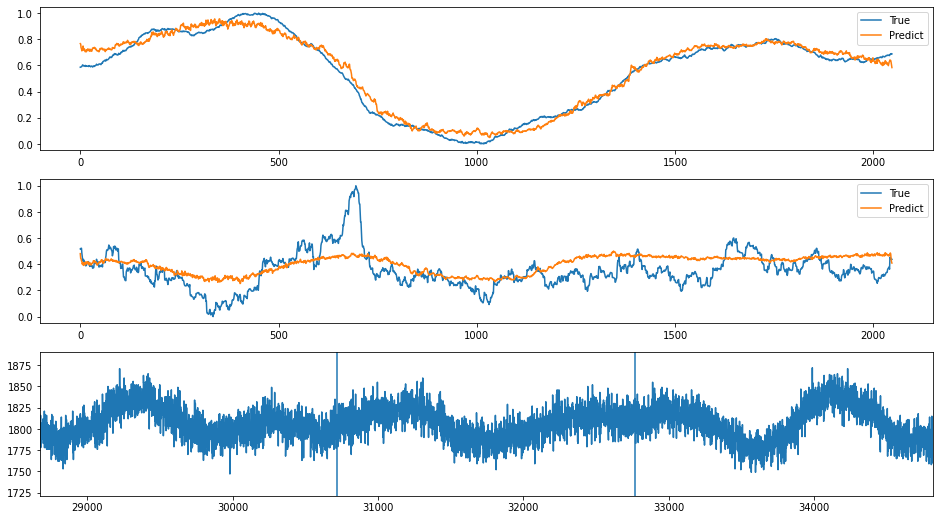

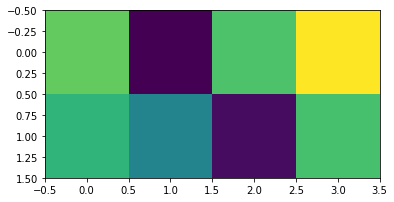

index: 282395
Error: 0.009402049243115915
type                                                         Inst
fill                                                         7137
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-09-08 04:59:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7137/...
n_bunches                                                    2556
bunch_index                                                  1111
bunch_number                                                  802
ts_length                                                   65536
chunk                                                          30
Name: 7722, dtype: object


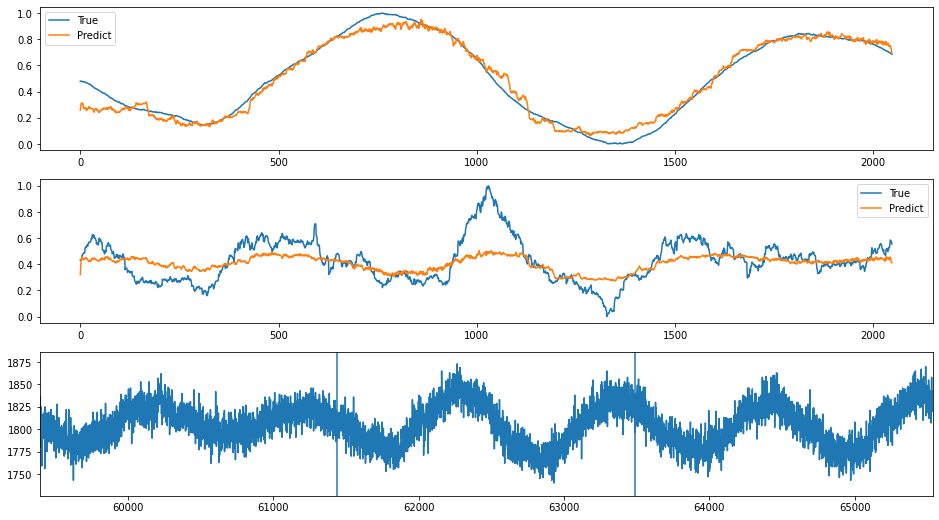

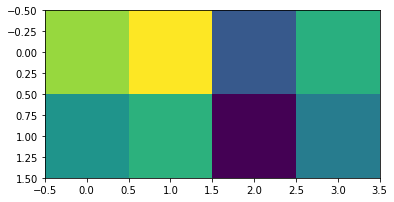

index: 43679
Error: 0.009446113054907137
type                                                         Inst
fill                                                         7035
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-07 18:17:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7035/...
n_bunches                                                    2556
bunch_index                                                  1758
bunch_number                                                 1303
ts_length                                                   65536
chunk                                                          25
Name: 6530, dtype: object


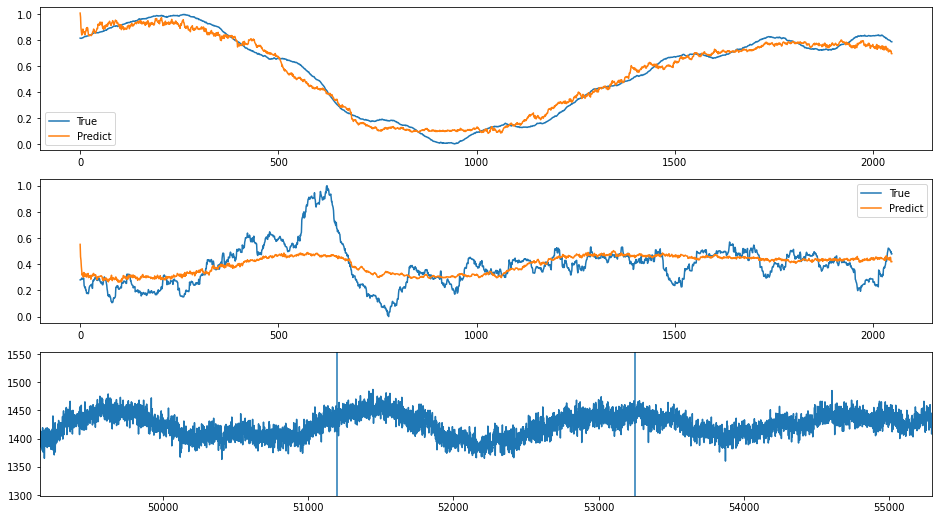

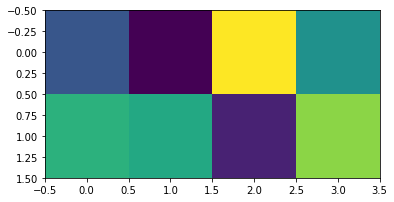

index: 208480
Error: 0.00945257067898739
type                                                         Inst
fill                                                         6245
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-26 19:12:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6245/...
n_bunches                                                    1916
bunch_index                                                  1989
bunch_number                                                 1088
ts_length                                                   65536
chunk                                                          24
Name: 6306, dtype: object


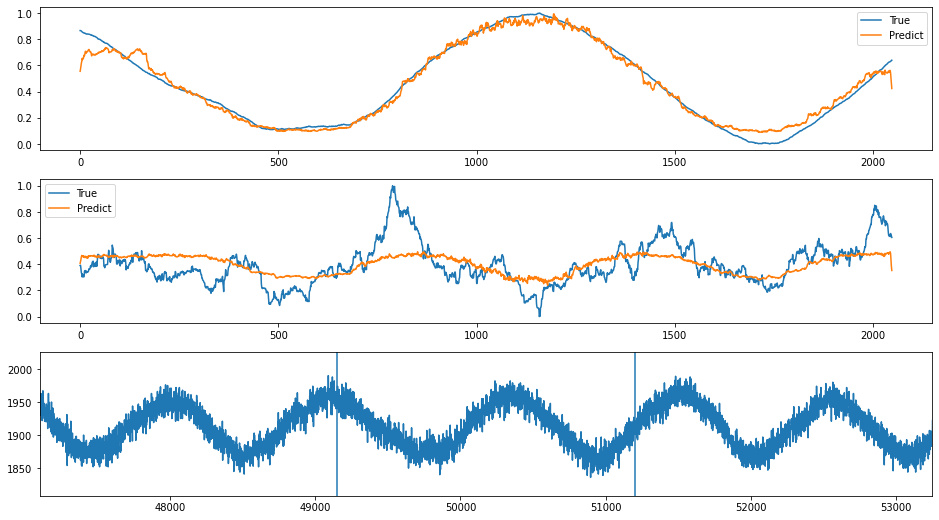

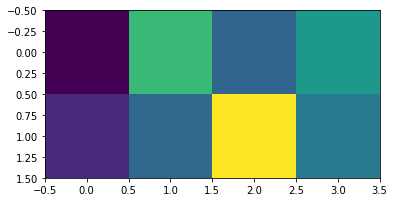

index: 279890
Error: 0.009483842706357222
type                                                         Inst
fill                                                         7444
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-15 07:45:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7444/...
n_bunches                                                     648
bunch_index                                                  2610
bunch_number                                                  487
ts_length                                                   65536
chunk                                                           3
Name: 823, dtype: object


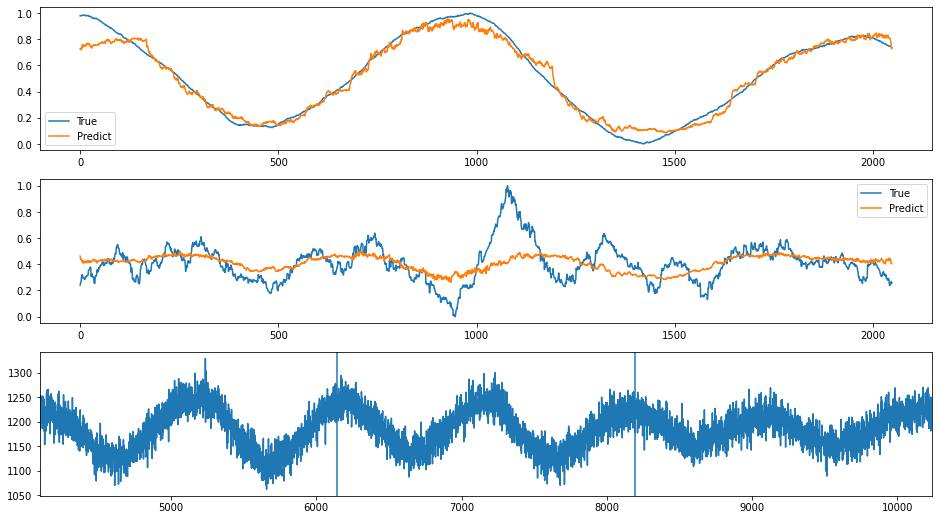

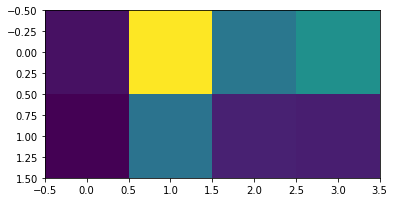

index: 364790
Error: 0.009844429396062601
type                                                         Inst
fill                                                         7052
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-13 22:22:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7052/...
n_bunches                                                    2556
bunch_index                                                   258
bunch_number                                                  164
ts_length                                                   65536
chunk                                                           6
Name: 1750, dtype: object


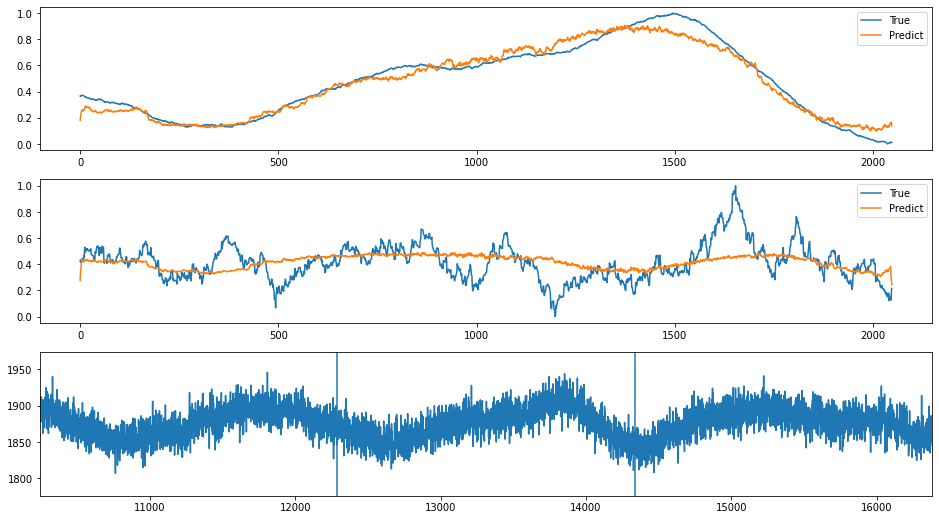

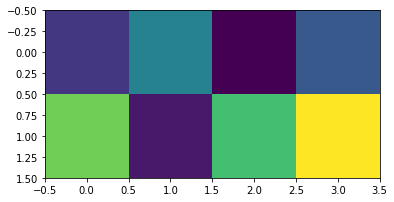

index: 46502
Error: 0.009953872182379125
type                                                         Inst
fill                                                         6711
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-22 10:23:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6711/...
n_bunches                                                    2556
bunch_index                                                  1926
bunch_number                                                 1407
ts_length                                                   65536
chunk                                                          17
Name: 4394, dtype: object


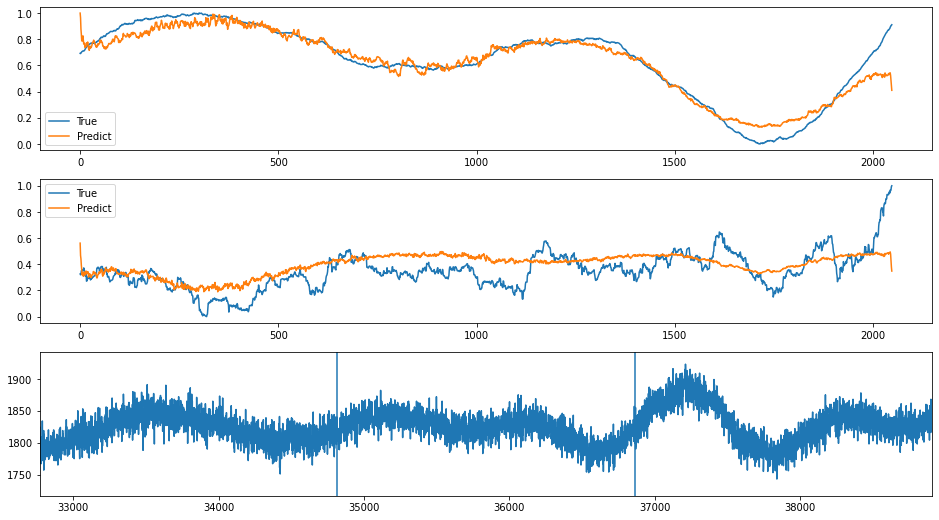

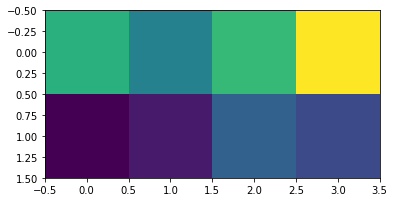

index: 173136
Error: 0.009960564372029348
type                                                         Inst
fill                                                         6891
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-06 16:50:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6891/...
n_bunches                                                    1452
bunch_index                                                   302
bunch_number                                                  119
ts_length                                                   65536
chunk                                                          11
Name: 2829, dtype: object


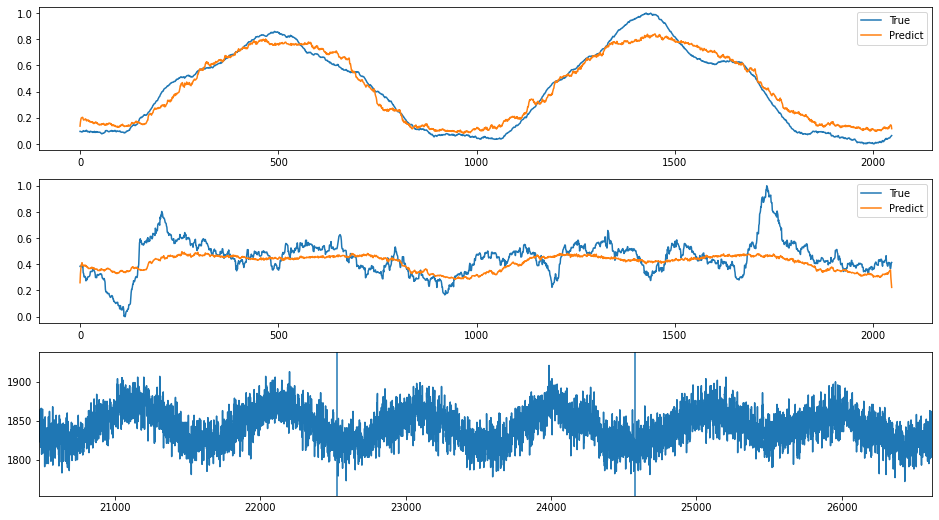

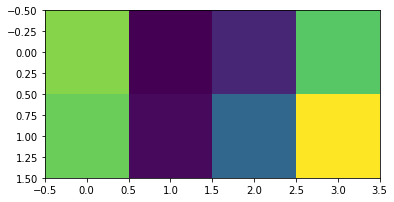

index: 13361
Error: 0.009990662358144577
type                                                         Inst
fill                                                         6690
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-16 04:59:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6690/...
n_bunches                                                    1227
bunch_index                                                  1197
bunch_number                                                  454
ts_length                                                   65536
chunk                                                           6
Name: 1784, dtype: object


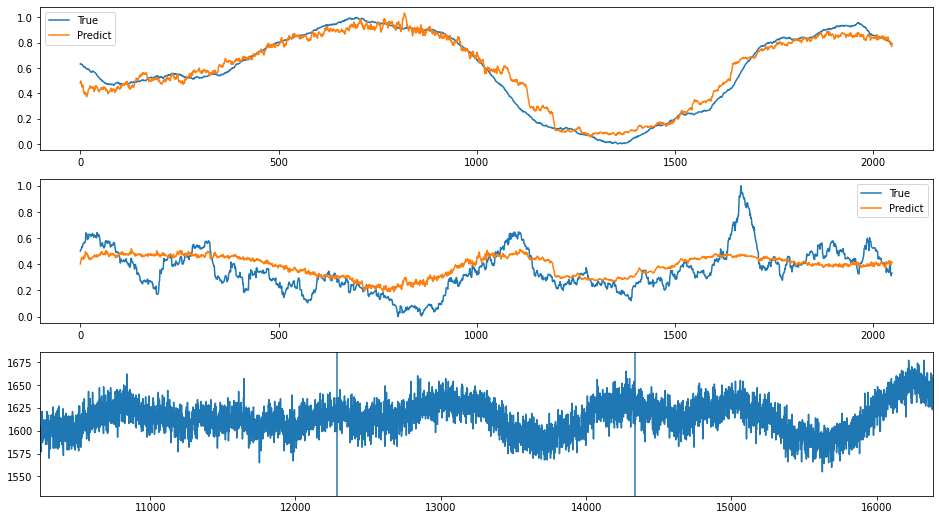

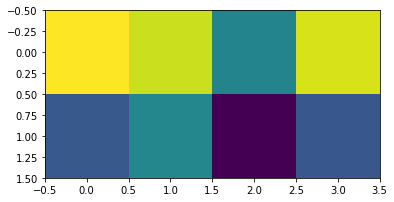

In [25]:
for i in range(10):
    index = sorted_error_indices[i]
    plot_train_index(index)

# From right to left

index: 206707
Error: 0.1131296325475406
type                                                         Inst
fill                                                         6351
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-31 15:08:46
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6351/...
n_bunches                                                     300
bunch_index                                                   403
bunch_number                                                  208
ts_length                                                   65536
chunk                                                           6
Name: 1700, dtype: object


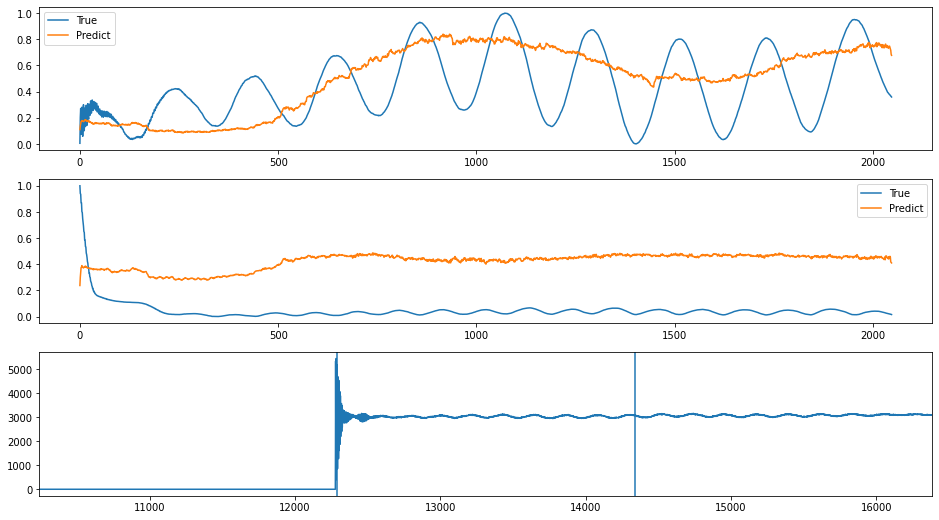

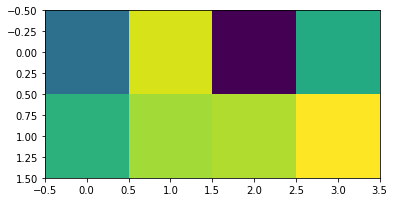

index: 108829
Error: 0.10407193833720693
type                                                         Inst
fill                                                         7017
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-03 22:23:08
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7017/...
n_bunches                                                    2556
bunch_index                                                    24
bunch_number                                                    6
ts_length                                                   65536
chunk                                                          17
Name: 4472, dtype: object


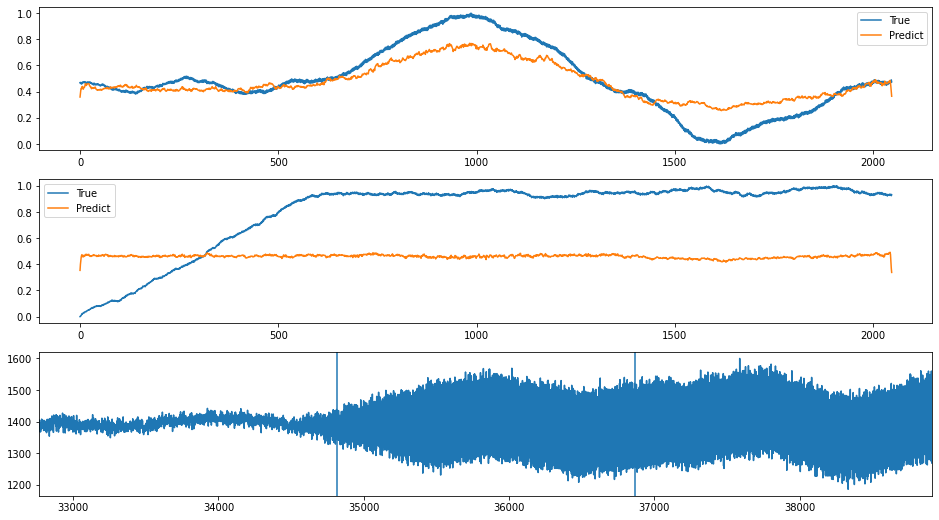

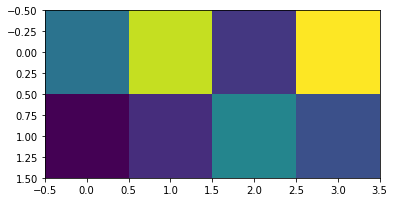

index: 148613
Error: 0.0993501267239732
type                                                         Inst
fill                                                         7468
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-23 19:40:34
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7468/...
n_bunches                                                     376
bunch_index                                                  1775
bunch_number                                                  375
ts_length                                                   65536
chunk                                                           9
Name: 2491, dtype: object


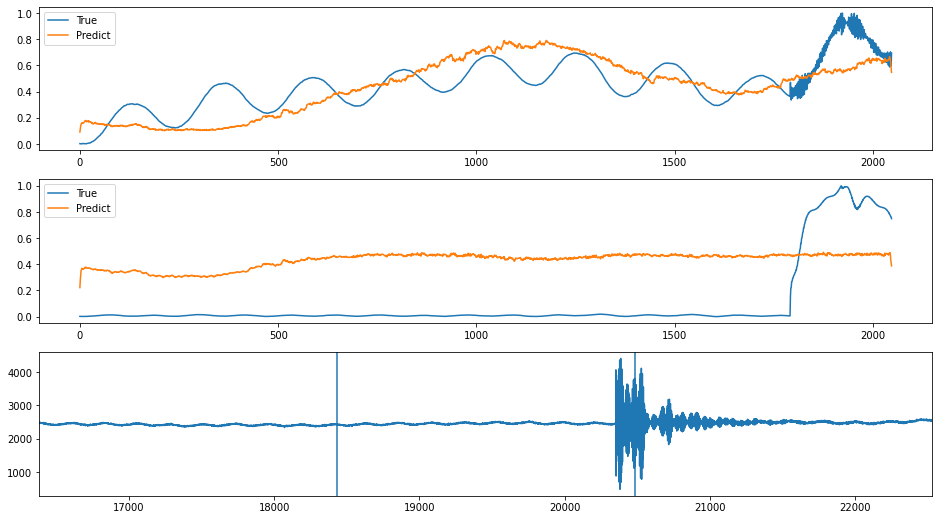

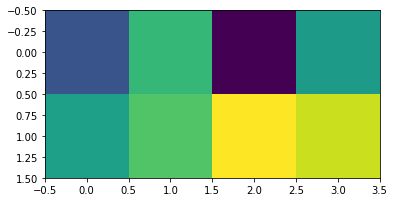

index: 306090
Error: 0.09910702841698289
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 21:22:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  1540
bunch_number                                                  849
ts_length                                                   65536
chunk                                                          26
Name: 6899, dtype: object


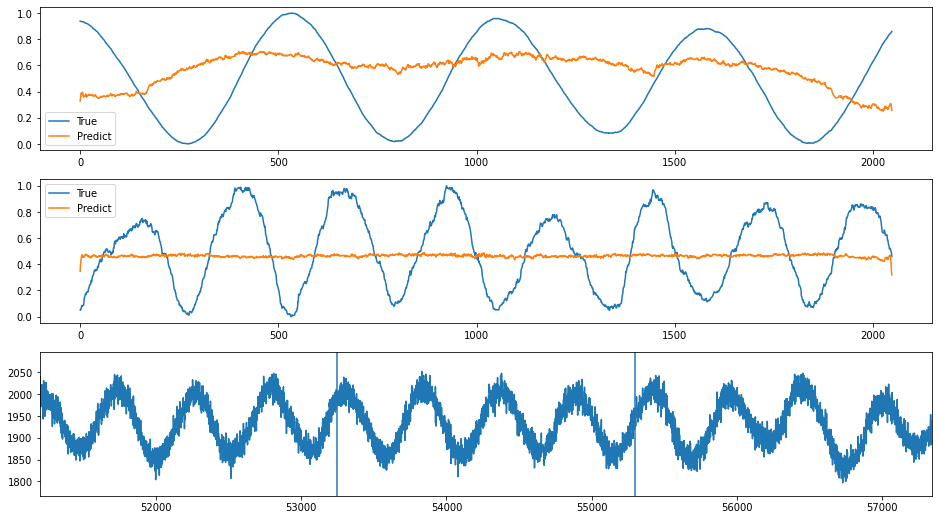

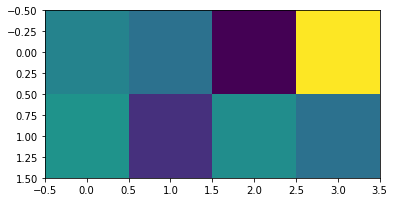

index: 390725
Error: 0.09406502722072668
type                                                         Inst
fill                                                         6215
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-16 23:37:31
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6215/...
n_bunches                                                    1452
bunch_index                                                   343
bunch_number                                                  248
ts_length                                                   65536
chunk                                                           6
Name: 1761, dtype: object


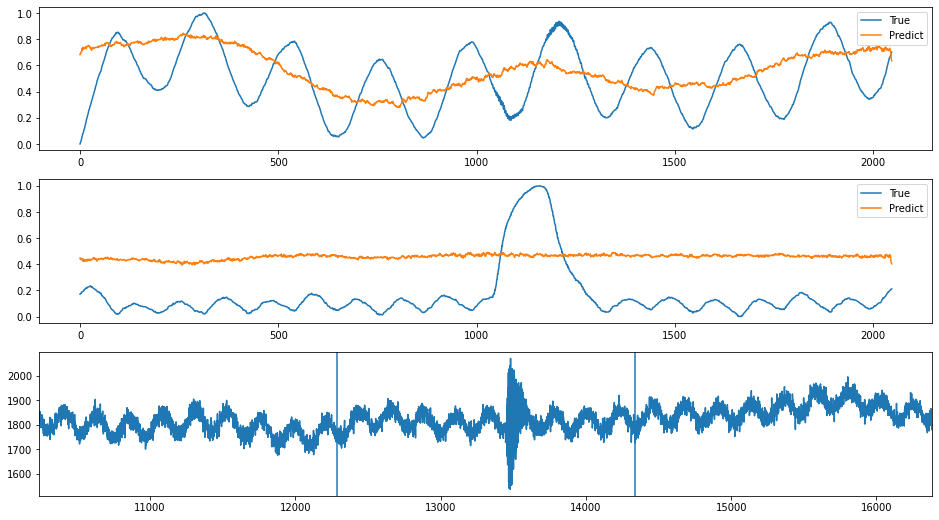

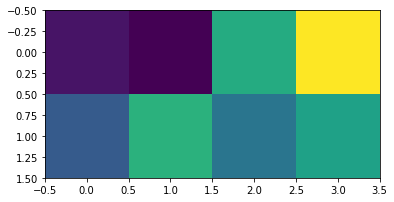

index: 147756
Error: 0.09217910553936412
type                                                         Inst
fill                                                         6837
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-24 23:40:59
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6837/...
n_bunches                                                       2
bunch_index                                                     0
bunch_number                                                    0
ts_length                                                   65536
chunk                                                           9
Name: 2466, dtype: object


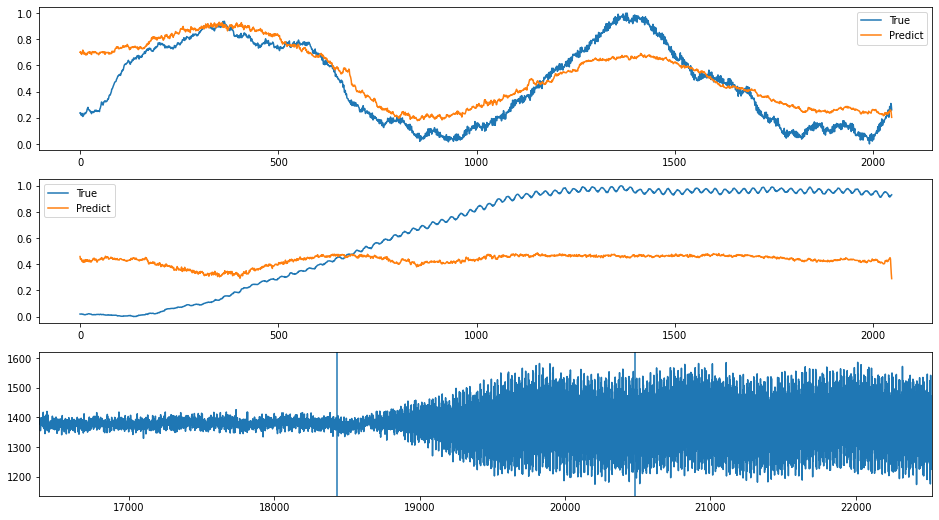

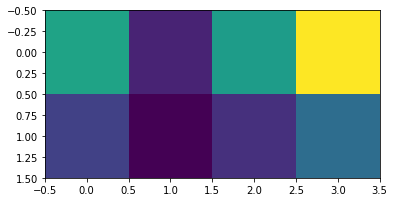

index: 297530
Error: 0.09202590549408453
type                                                         Inst
fill                                                         6246
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-27 04:44:22
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6246/...
n_bunches                                                     404
bunch_index                                                   576
bunch_number                                                  307
ts_length                                                   65536
chunk                                                           0
Name: 48, dtype: object


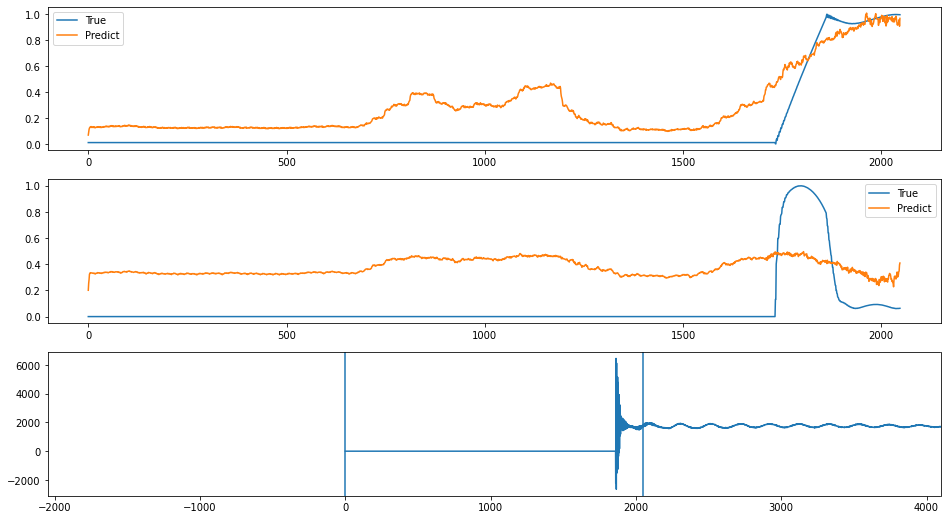

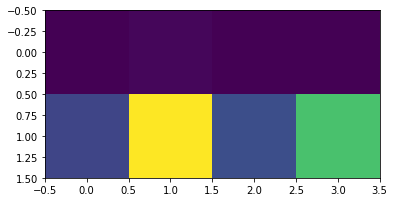

index: 259498
Error: 0.09087177090232292
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 21:22:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  1172
bunch_number                                                  642
ts_length                                                   65536
chunk                                                           5
Name: 1469, dtype: object


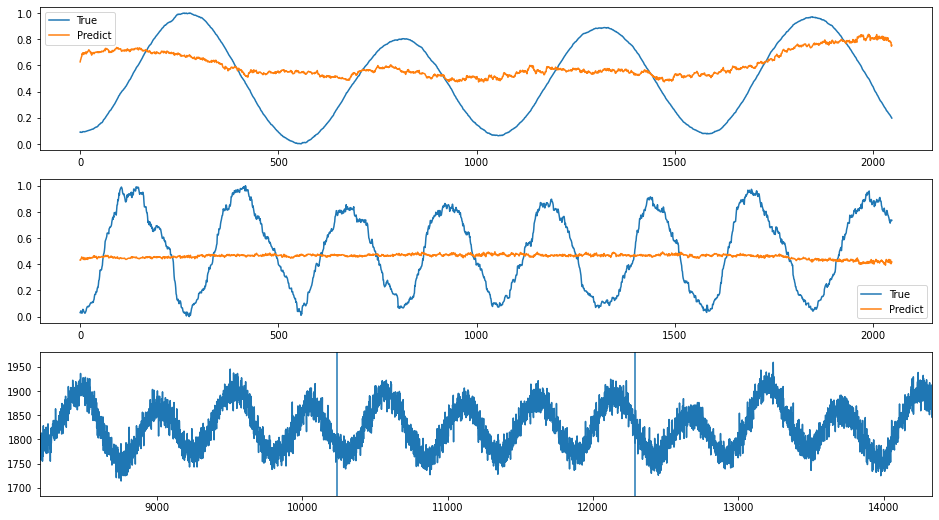

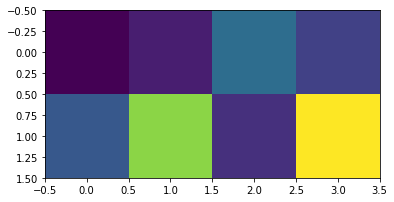

index: 343977
Error: 0.09086069304048859
type                                                         Inst
fill                                                         6880
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-03 02:40:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6880/...
n_bunches                                                     734
bunch_index                                                  1502
bunch_number                                                  306
ts_length                                                   65536
chunk                                                           7
Name: 1892, dtype: object


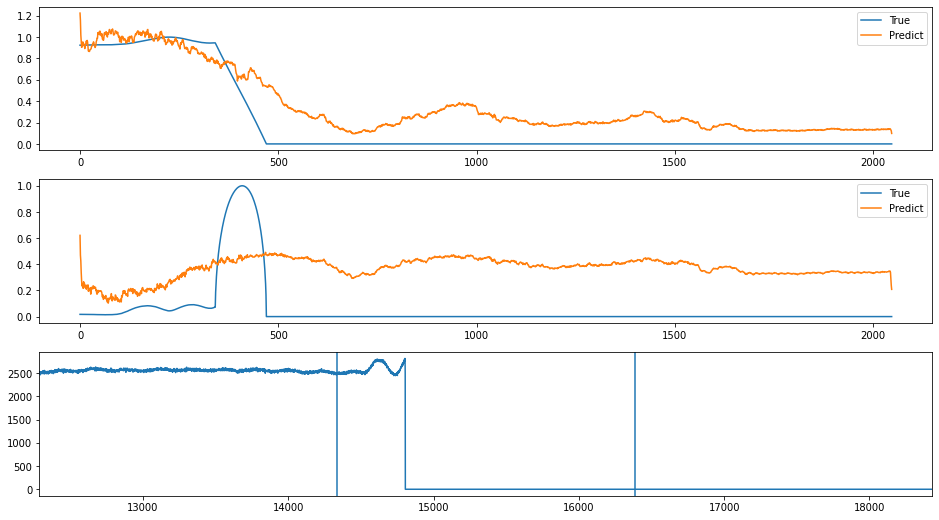

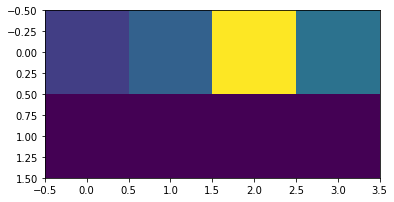

index: 47037
Error: 0.08846043838697416
type                                                         Inst
fill                                                         6736
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-28 16:45:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6736/...
n_bunches                                                       2
bunch_index                                                  1785
bunch_number                                                    1
ts_length                                                   65536
chunk                                                          11
Name: 2961, dtype: object


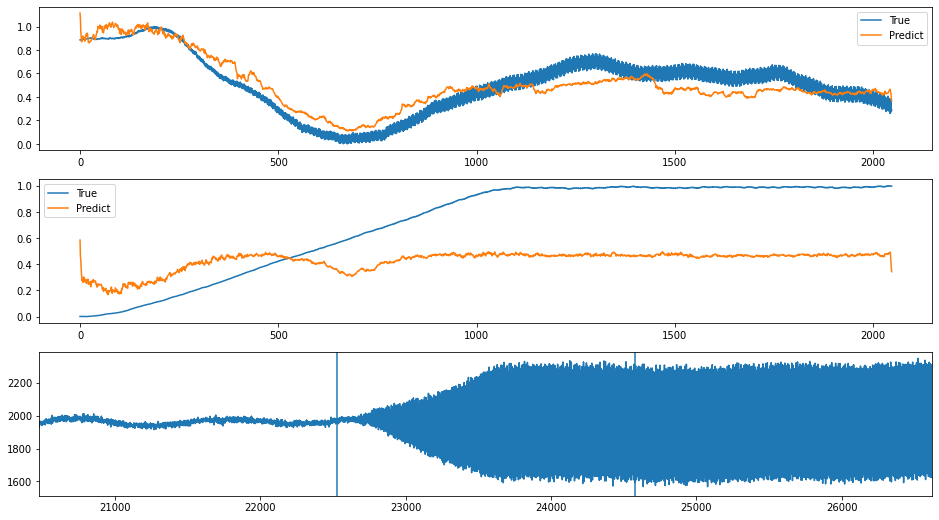

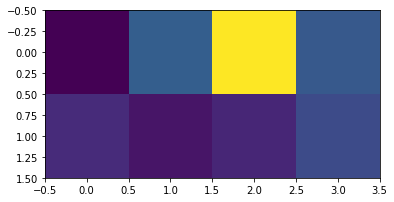

index: 40785
Error: 0.08821687776987043
type                                                         Inst
fill                                                         6736
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-28 16:45:09
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6736/...
n_bunches                                                       2
bunch_index                                                  1785
bunch_number                                                    1
ts_length                                                   65536
chunk                                                          15
Name: 3985, dtype: object


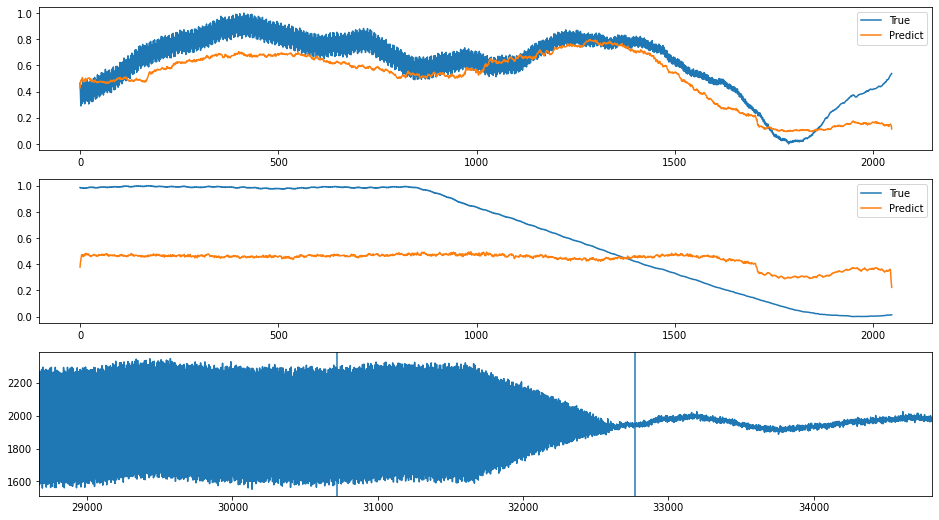

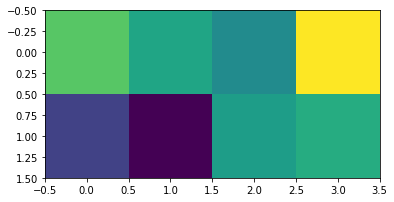

index: 3094
Error: 0.0879622249227706
type                                                         Inst
fill                                                         7331
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-22 14:58:45
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7331/...
n_bunches                                                     396
bunch_index                                                   461
bunch_number                                                  322
ts_length                                                   65536
chunk                                                          10
Name: 2690, dtype: object


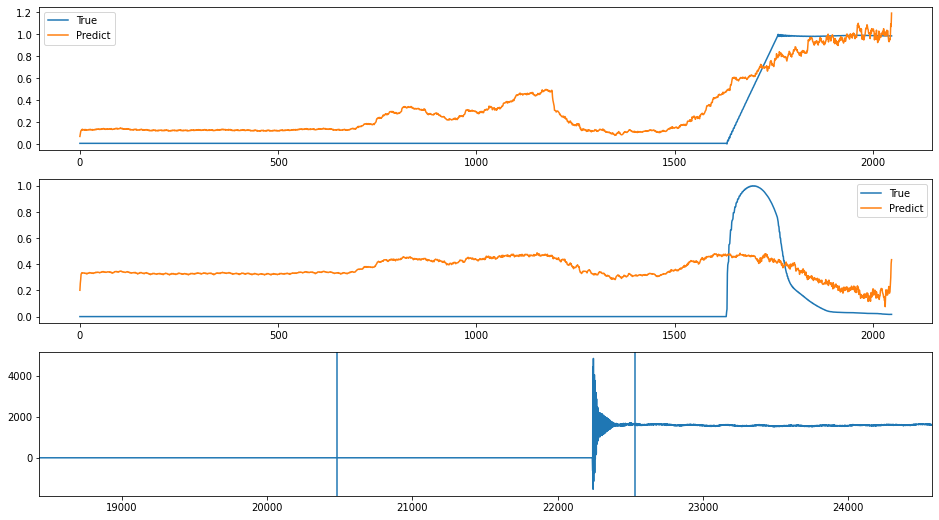

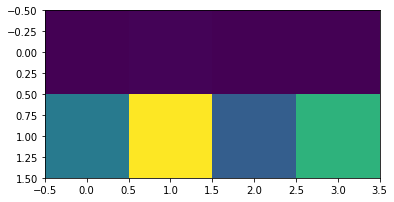

index: 276676
Error: 0.08794954553945354
type                                                         Inst
fill                                                         6268
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-03 12:24:50
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6268/...
n_bunches                                                     300
bunch_index                                                   479
bunch_number                                                  244
ts_length                                                   65536
chunk                                                          26
Name: 6674, dtype: object


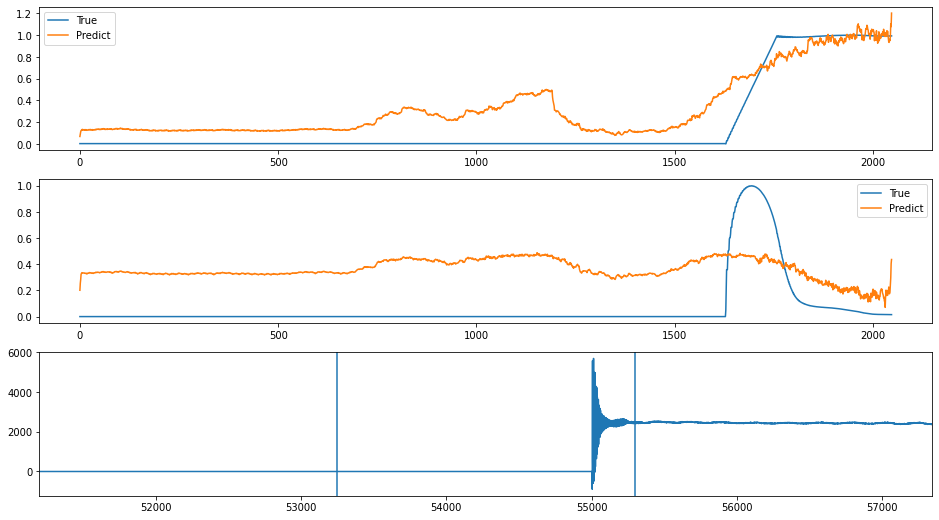

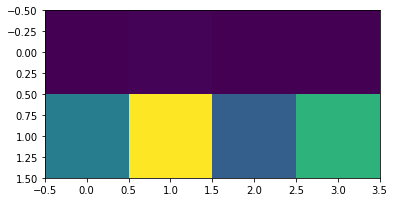

index: 53495
Error: 0.08737028077081556
type                                                         Inst
fill                                                         6693
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-16 20:07:53
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6693/...
n_bunches                                                     156
bunch_index                                                   107
bunch_number                                                   59
ts_length                                                   65536
chunk                                                           1
Name: 411, dtype: object


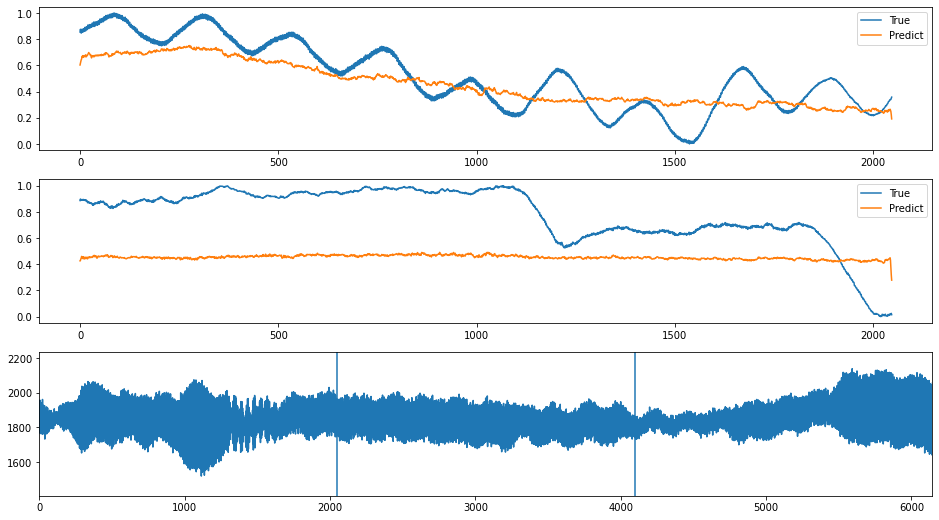

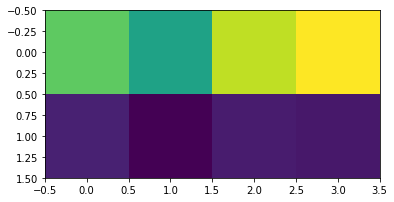

index: 150640
Error: 0.08612854850969182
type                                                         Inst
fill                                                         7492
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-12-02 15:11:19
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7492/...
n_bunches                                                     271
bunch_index                                                  1122
bunch_number                                                  232
ts_length                                                   65536
chunk                                                          11
Name: 2937, dtype: object


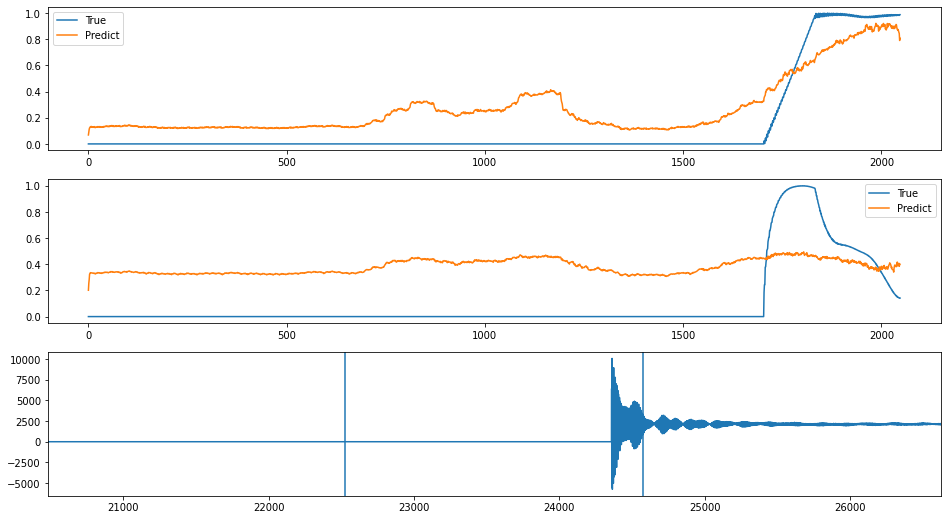

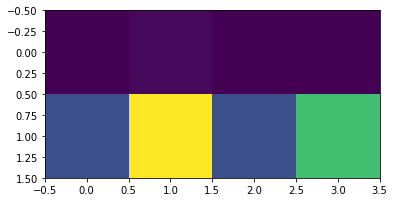

index: 236766
Error: 0.08574890490368818
type                                                         Inst
fill                                                         6749
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-01 03:48:59
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6749/...
n_bunches                                                     252
bunch_index                                                   113
bunch_number                                                   45
ts_length                                                   65536
chunk                                                           1
Name: 431, dtype: object


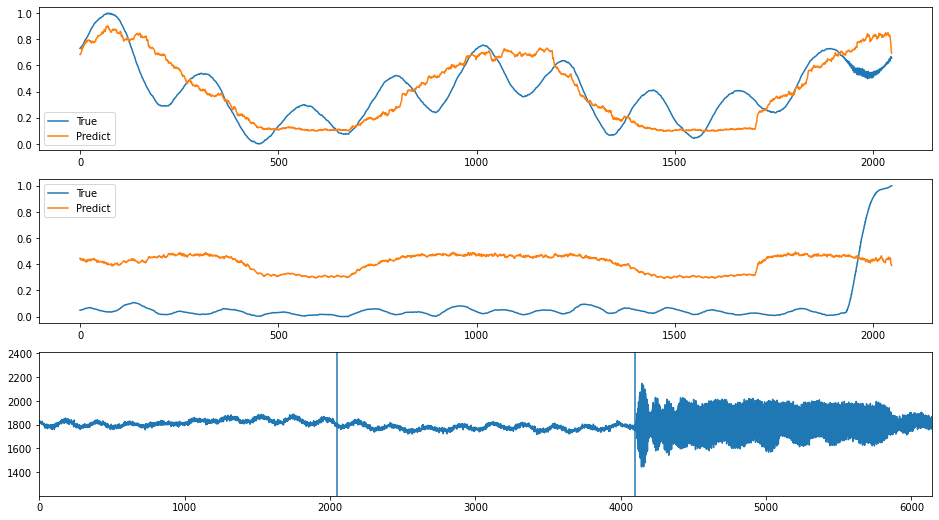

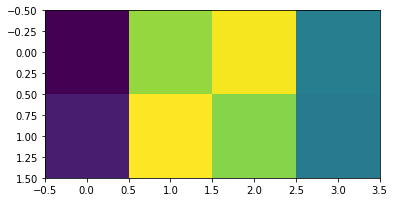

index: 380684
Error: 0.08453822925824722
type                                                         Inst
fill                                                         6256
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-30 02:08:25
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6256/...
n_bunches                                                      68
bunch_index                                                    86
bunch_number                                                   36
ts_length                                                   65536
chunk                                                           4
Name: 1216, dtype: object


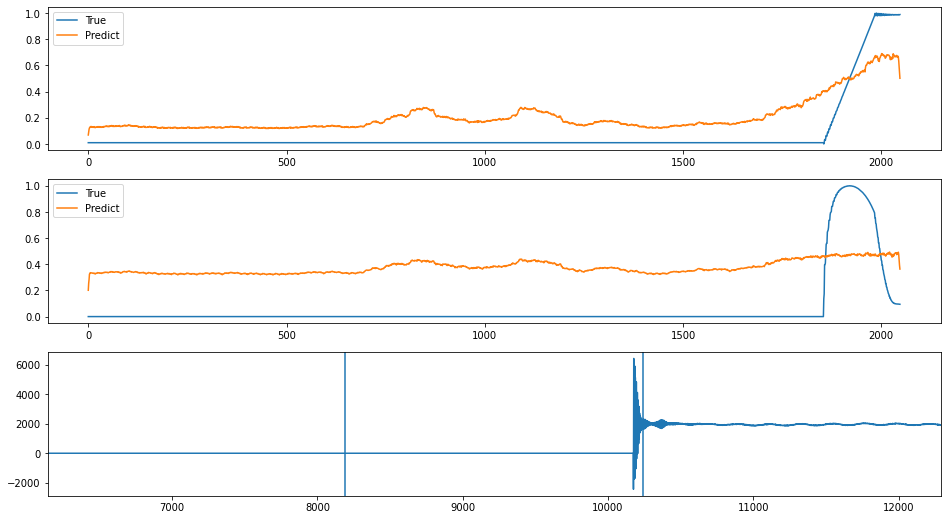

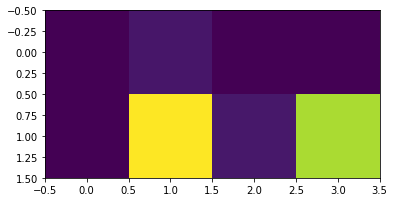

index: 312026
Error: 0.08431869923150745
type                                                         Inst
fill                                                         7470
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-24 09:56:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7470/...
n_bunches                                                     502
bunch_index                                                  2213
bunch_number                                                  465
ts_length                                                   65536
chunk                                                           8
Name: 2267, dtype: object


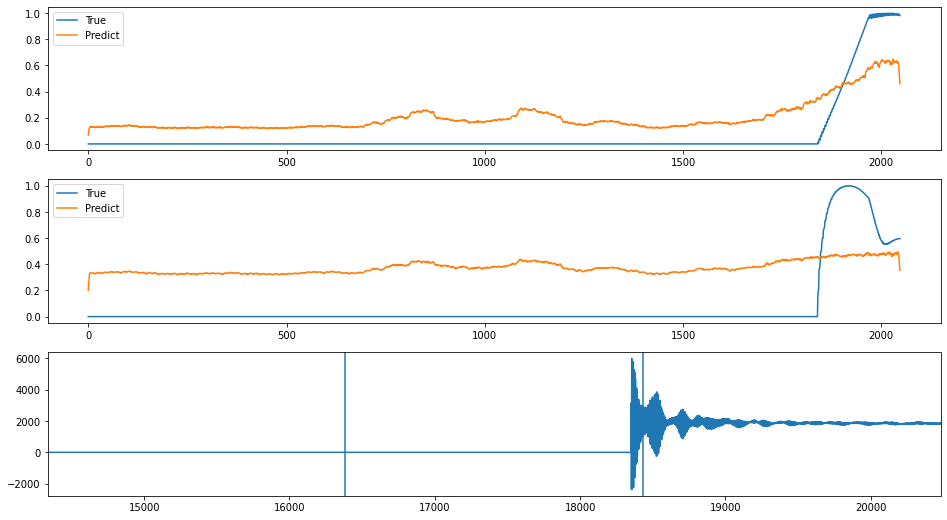

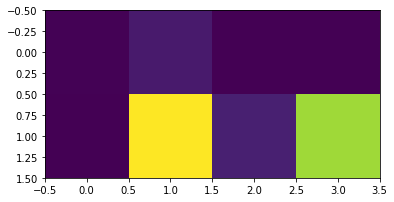

index: 94791
Error: 0.08425491045554137
type                                                         Inst
fill                                                         7036
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-07 20:39:42
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7036/...
n_bunches                                                     746
bunch_index                                                   477
bunch_number                                                  143
ts_length                                                   65536
chunk                                                          12
Name: 3273, dtype: object


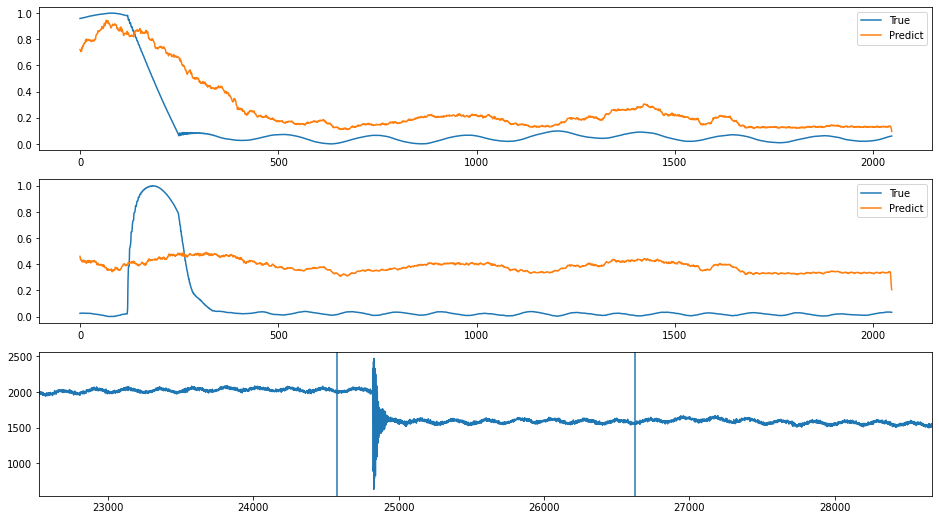

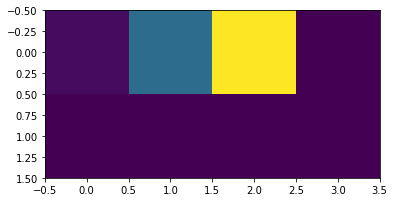

index: 32190
Error: 0.08398612938150471
type                                                         Inst
fill                                                         6689
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-16 01:02:32
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6689/...
n_bunches                                                     168
bunch_index                                                   290
bunch_number                                                  152
ts_length                                                   65536
chunk                                                          11
Name: 2823, dtype: object


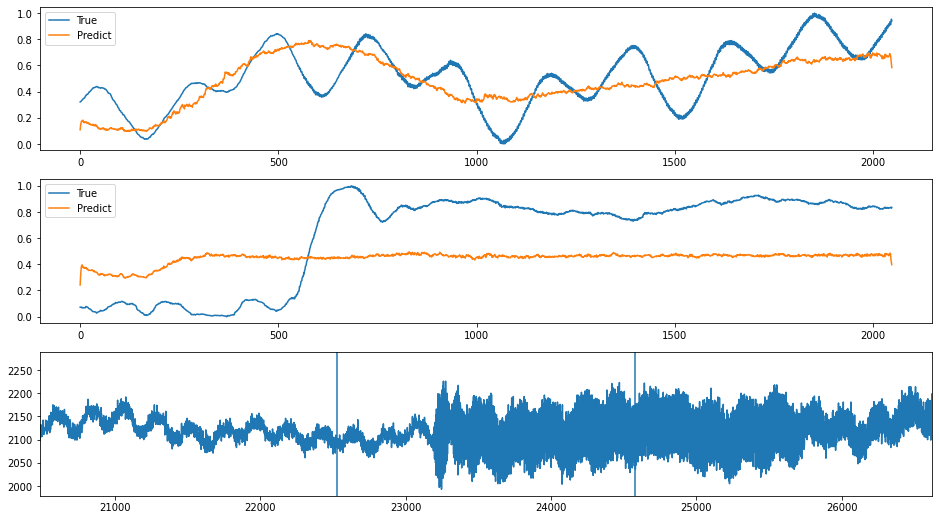

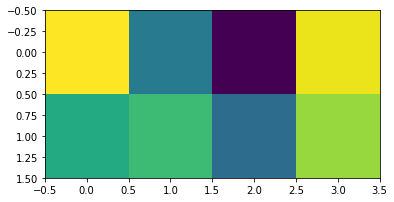

index: 333439
Error: 0.08330068229046757
type                                                         Inst
fill                                                         6659
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-09 00:18:56
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6659/...
n_bunches                                                     252
bunch_index                                                    95
bunch_number                                                   27
ts_length                                                   65536
chunk                                                           4
Name: 1191, dtype: object


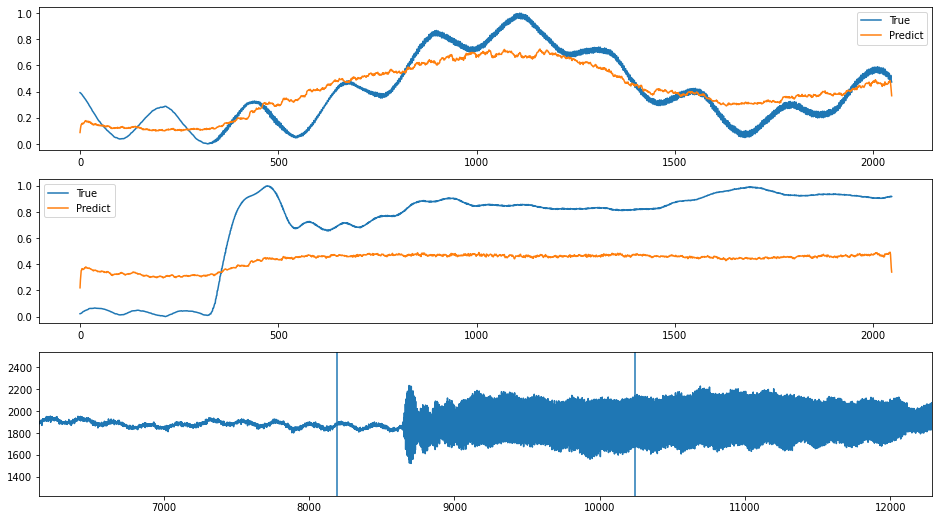

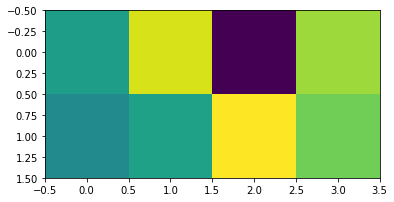

index: 22787
Error: 0.08328744541741566
type                                                         Inst
fill                                                         7346
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-25 08:01:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7346/...
n_bunches                                                     780
bunch_index                                                   981
bunch_number                                                  710
ts_length                                                   65536
chunk                                                          20
Name: 5237, dtype: object


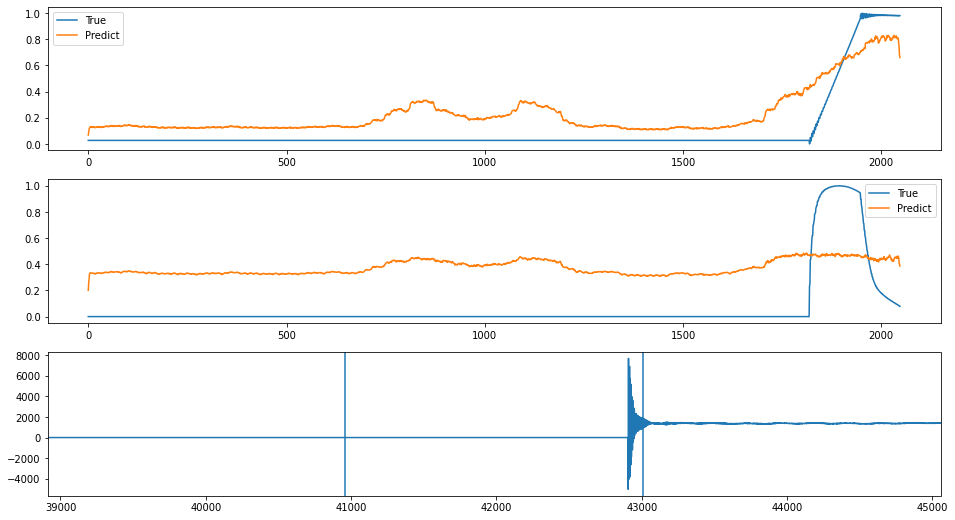

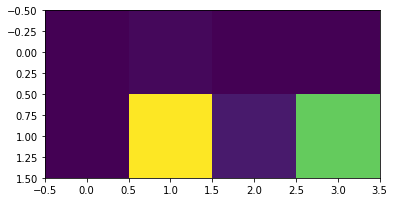

index: 292763
Error: 0.0829474908255497
type                                                         Inst
fill                                                         6707
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-20 14:27:47
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6707/...
n_bunches                                                     252
bunch_index                                                   350
bunch_number                                                  230
ts_length                                                   65536
chunk                                                          13
Name: 3400, dtype: object


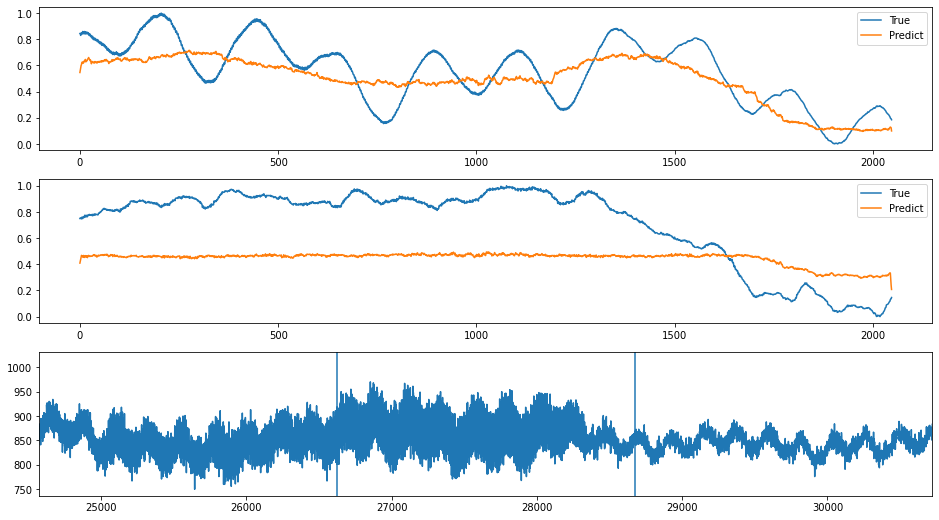

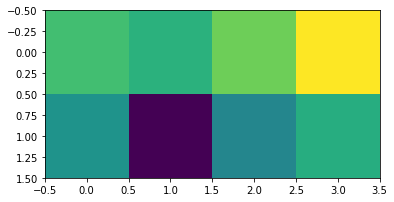

index: 304702
Error: 0.08269537385510156
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 21:22:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  1540
bunch_number                                                  849
ts_length                                                   65536
chunk                                                          12
Name: 3315, dtype: object


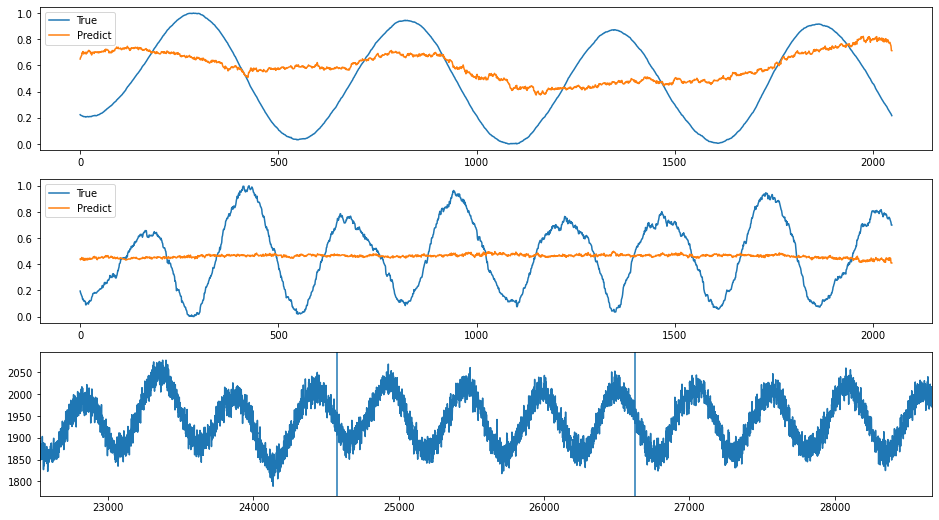

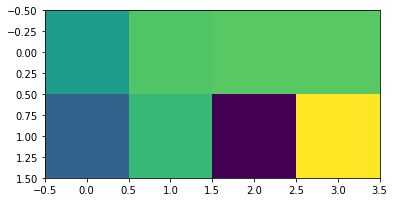

index: 374028
Error: 0.08266252380521902
type                                                         Inst
fill                                                         6621
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-04-29 04:17:35
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6621/...
n_bunches                                                     312
bunch_index                                                   582
bunch_number                                                  294
ts_length                                                   65536
chunk                                                           9
Name: 2446, dtype: object


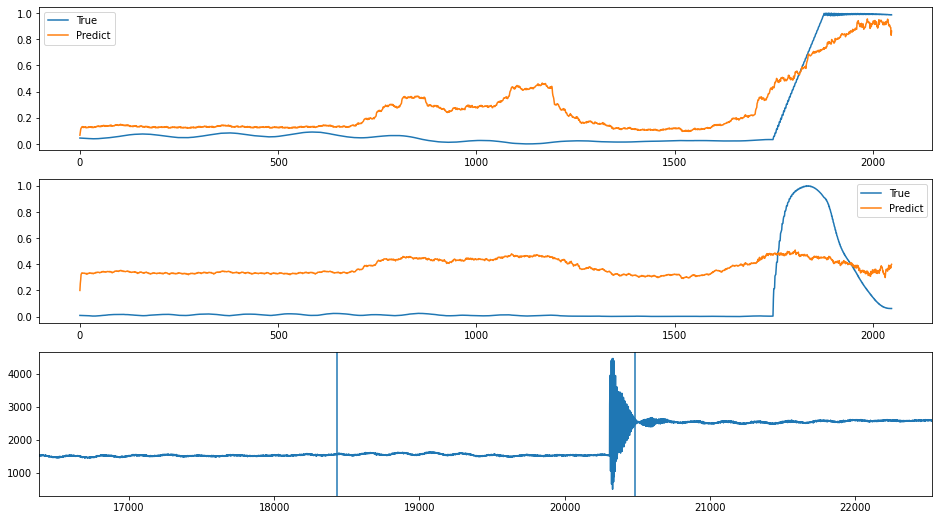

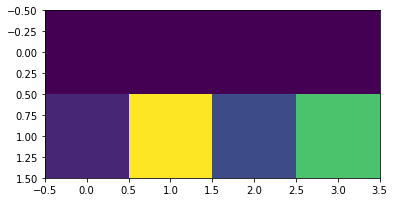

index: 367346
Error: 0.08233496802527865
type                                                         Inst
fill                                                         6957
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-21 22:27:20
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6957/...
n_bunches                                                     396
bunch_index                                                   242
bunch_number                                                  155
ts_length                                                   65536
chunk                                                          10
Name: 2803, dtype: object


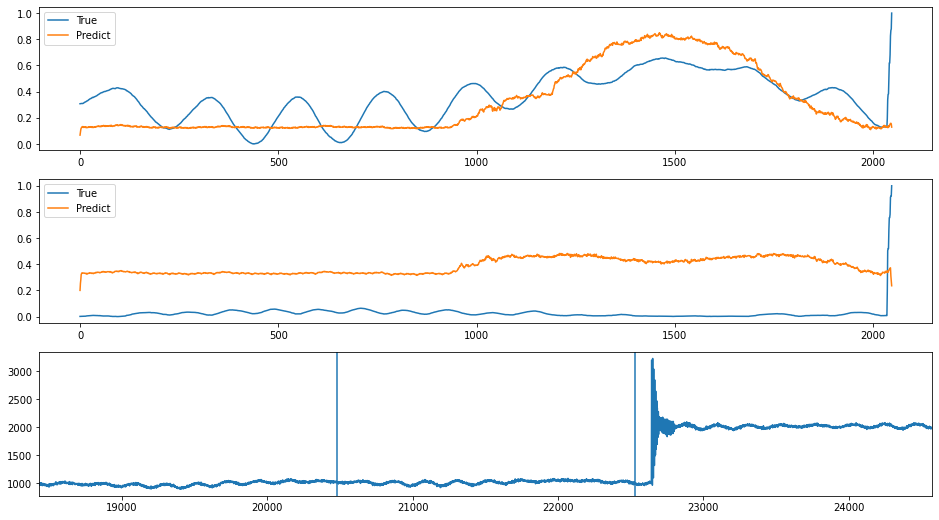

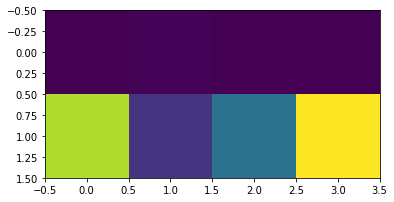

index: 244463
Error: 0.08228429220133983
type                                                         Inst
fill                                                         7058
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-17 05:33:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7058/...
n_bunches                                                     420
bunch_index                                                  1735
bunch_number                                                  334
ts_length                                                   65536
chunk                                                           9
Name: 2449, dtype: object


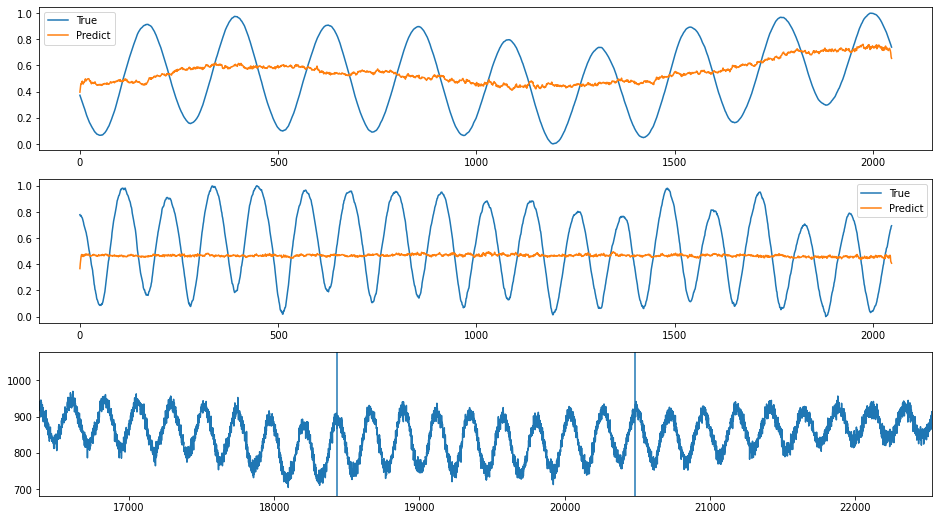

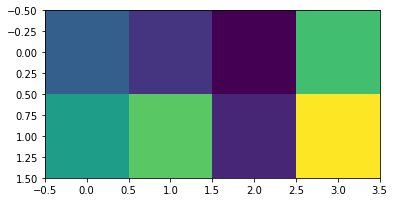

index: 287933
Error: 0.08220145805067003
type                                                         Inst
fill                                                         6254
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 05:31:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6254/...
n_bunches                                                     292
bunch_index                                                   471
bunch_number                                                  253
ts_length                                                   65536
chunk                                                           7
Name: 1917, dtype: object


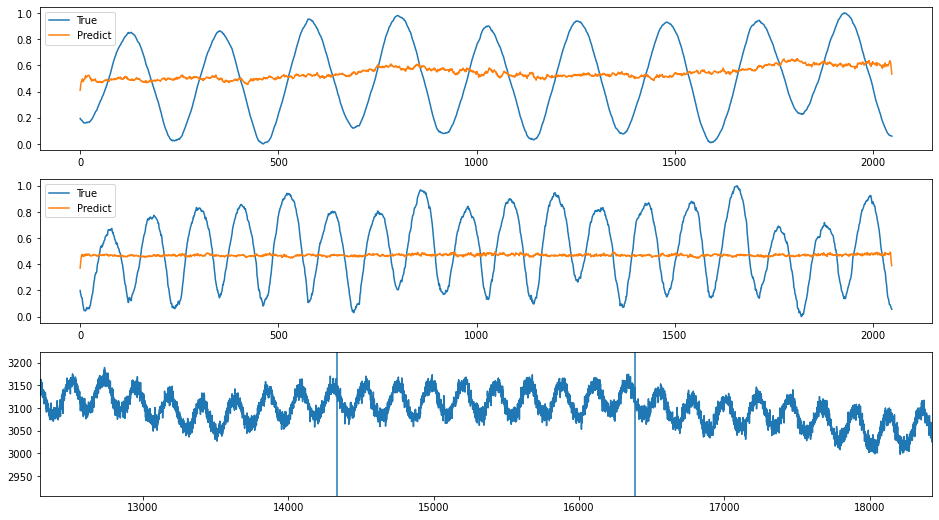

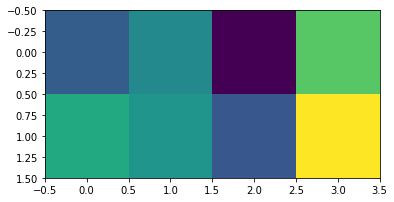

index: 51507
Error: 0.0821075536772712
type                                                         Inst
fill                                                         7109
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-31 19:45:56
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7109/...
n_bunches                                                     924
bunch_index                                                   257
bunch_number                                                  163
ts_length                                                   65536
chunk                                                          11
Name: 2896, dtype: object


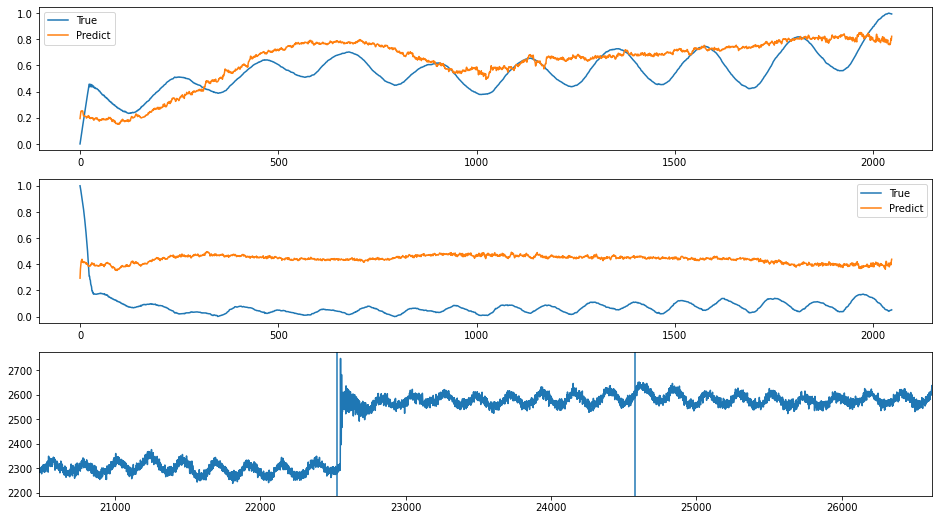

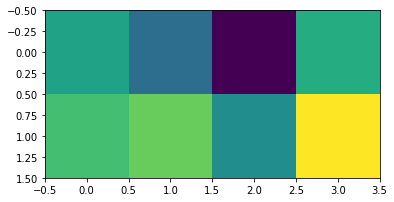

index: 367288
Error: 0.08206334054302651
type                                                         Inst
fill                                                         6738
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-29 00:04:16
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6738/...
n_bunches                                                     252
bunch_index                                                    43
bunch_number                                                    6
ts_length                                                   65536
chunk                                                          13
Name: 3496, dtype: object


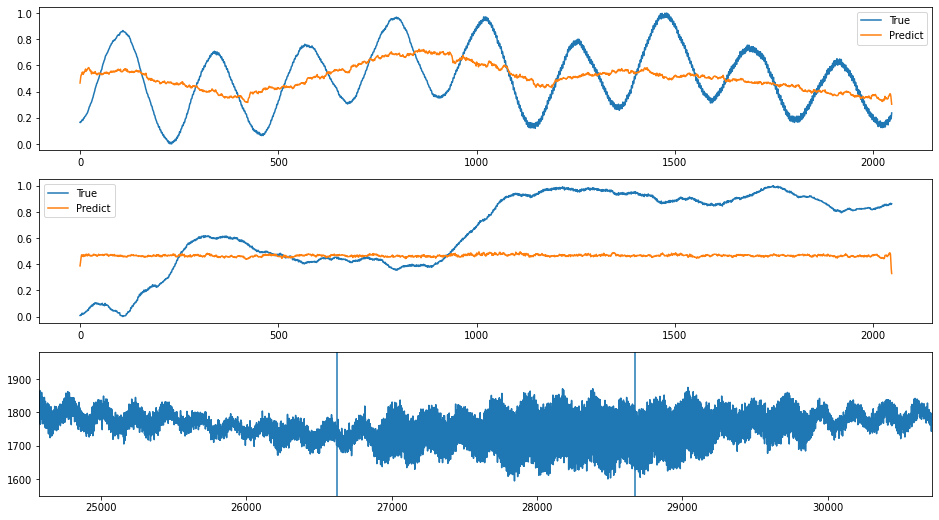

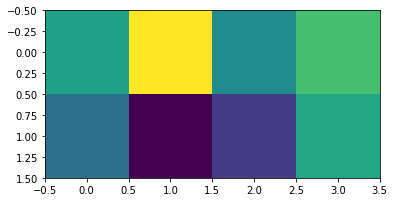

index: 234772
Error: 0.08172328923933488
type                                                         Inst
fill                                                         6749
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-01 03:48:59
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6749/...
n_bunches                                                     252
bunch_index                                                   113
bunch_number                                                   45
ts_length                                                   65536
chunk                                                          15
Name: 4015, dtype: object


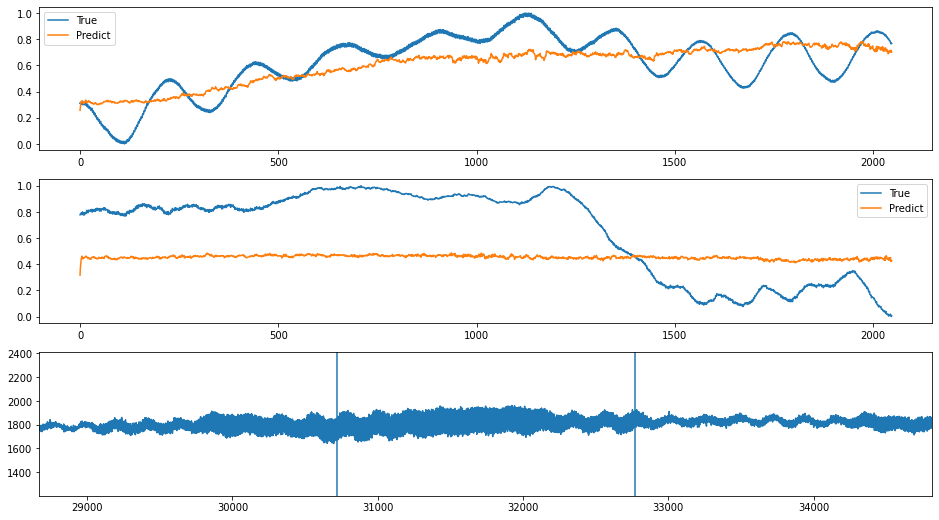

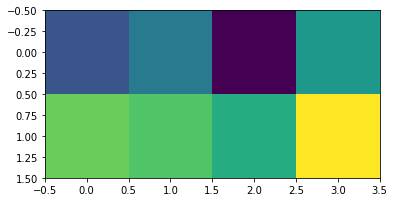

index: 350008
Error: 0.08166957394123876
type                                                         Inst
fill                                                         6278
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-10-06 22:54:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6278/...
n_bunches                                                     172
bunch_index                                                    52
bunch_number                                                   19
ts_length                                                   65536
chunk                                                          27
Name: 7071, dtype: object


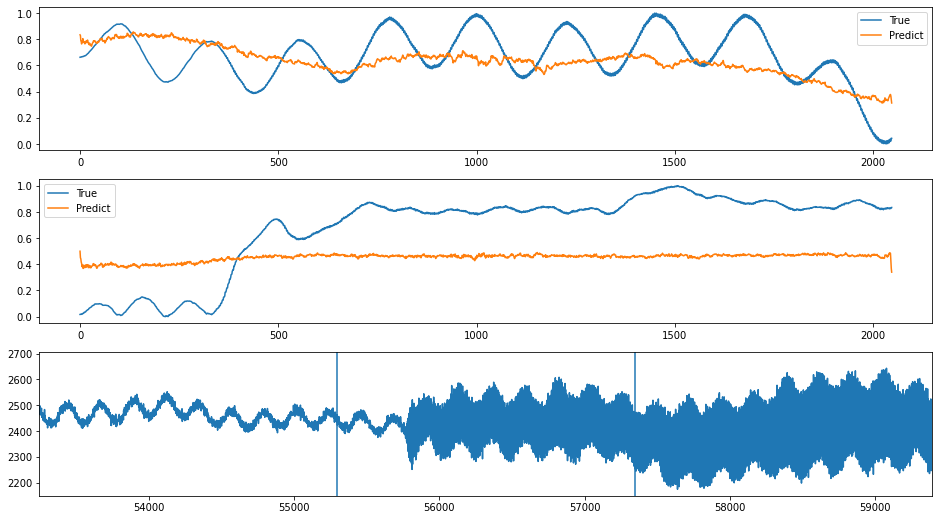

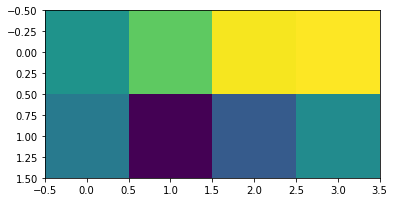

index: 21809
Error: 0.08156237792243419
type                                                         Inst
fill                                                         6702
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-19 21:52:11
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6702/...
n_bunches                                                     252
bunch_index                                                   236
bunch_number                                                  130
ts_length                                                   65536
chunk                                                           8
Name: 2162, dtype: object


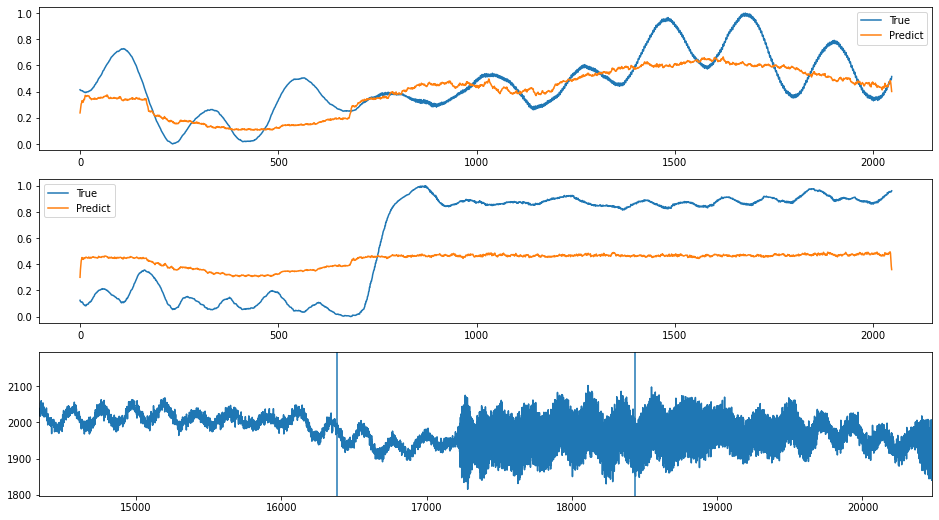

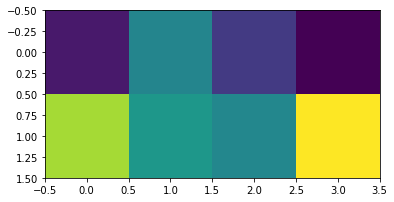

index: 147347
Error: 0.0813823989765163
type                                                         Inst
fill                                                         6837
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-24 23:40:59
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6837/...
n_bunches                                                       2
bunch_index                                                     0
bunch_number                                                    0
ts_length                                                   65536
chunk                                                          13
Name: 3490, dtype: object


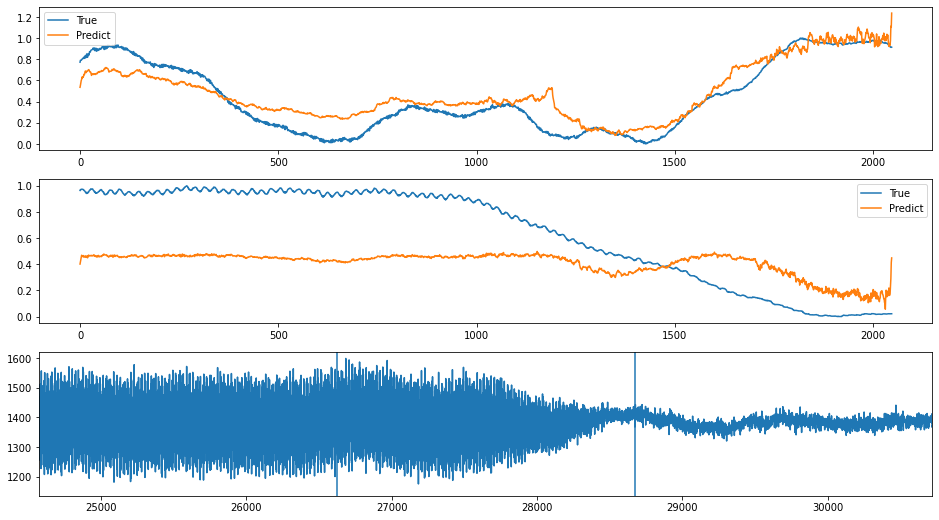

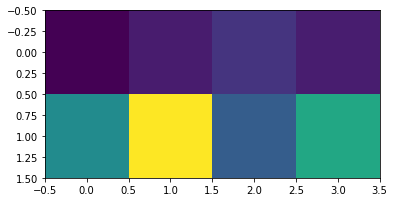

index: 39322
Error: 0.08134620200637865
type                                                         Inst
fill                                                         6572
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-04-17 23:11:08
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6572/...
n_bunches                                                     372
bunch_index                                                   269
bunch_number                                                  135
ts_length                                                   65536
chunk                                                          10
Name: 2568, dtype: object


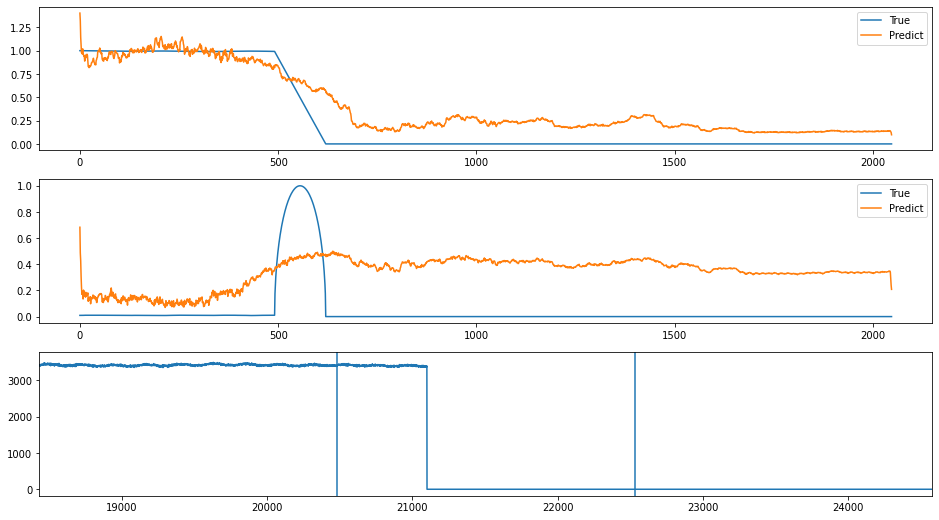

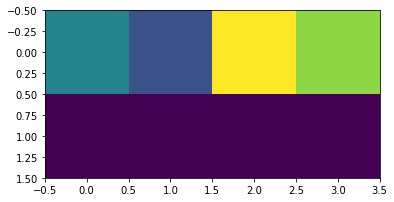

index: 58066
Error: 0.08051234109232391
type                                                         Inst
fill                                                         7078
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-23 14:13:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7078/...
n_bunches                                                     636
bunch_index                                                   774
bunch_number                                                  548
ts_length                                                   65536
chunk                                                          15
Name: 3868, dtype: object


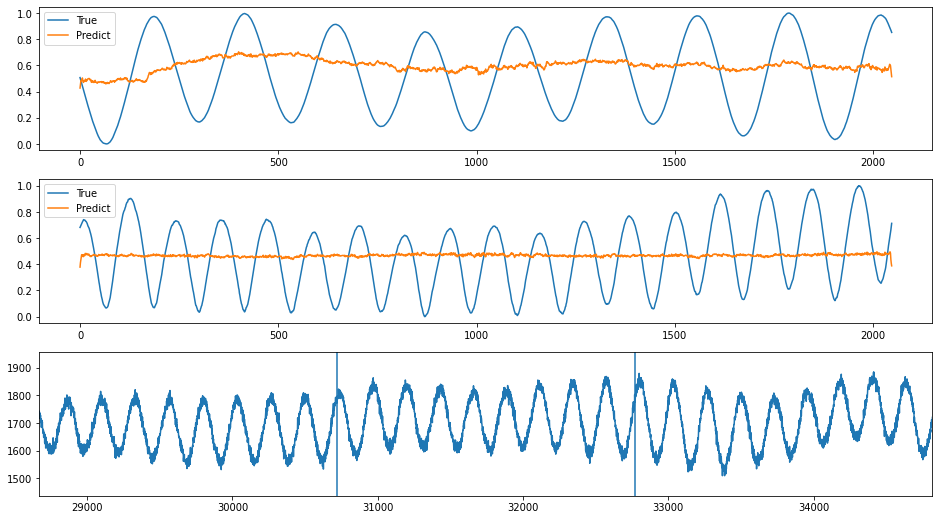

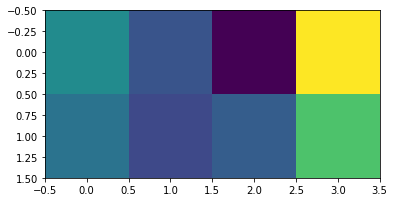

index: 32142
Error: 0.08010164076343301
type                                                         Inst
fill                                                         7266
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-08 02:19:59
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7266/...
n_bunches                                                     396
bunch_index                                                   464
bunch_number                                                  325
ts_length                                                   65536
chunk                                                           9
Name: 2488, dtype: object


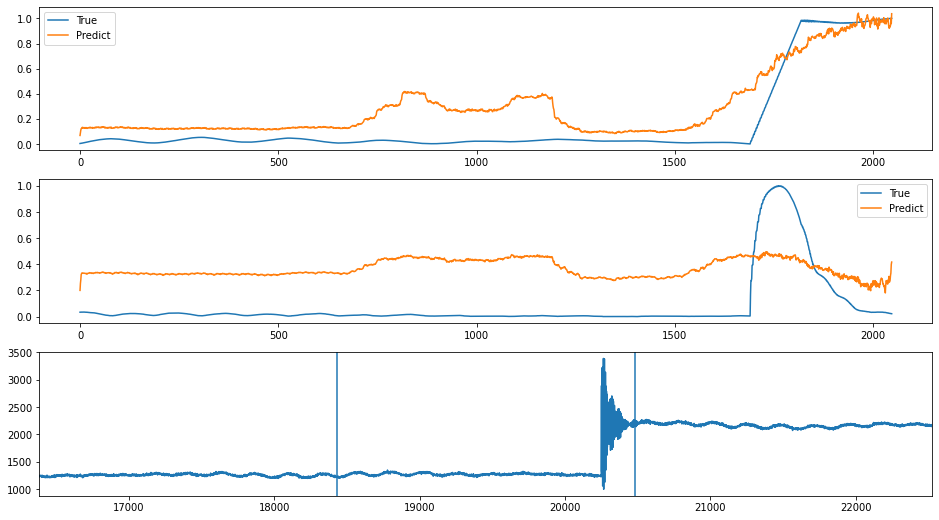

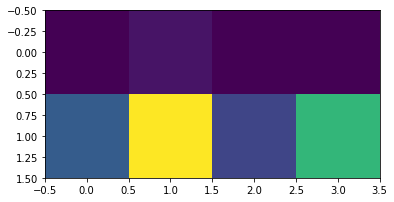

index: 45890
Error: 0.07983713678096202
type                                                         Inst
fill                                                         6859
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-28 13:39:16
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6859/...
n_bunches                                                     684
bunch_index                                                   848
bunch_number                                                  609
ts_length                                                   65536
chunk                                                           9
Name: 2335, dtype: object


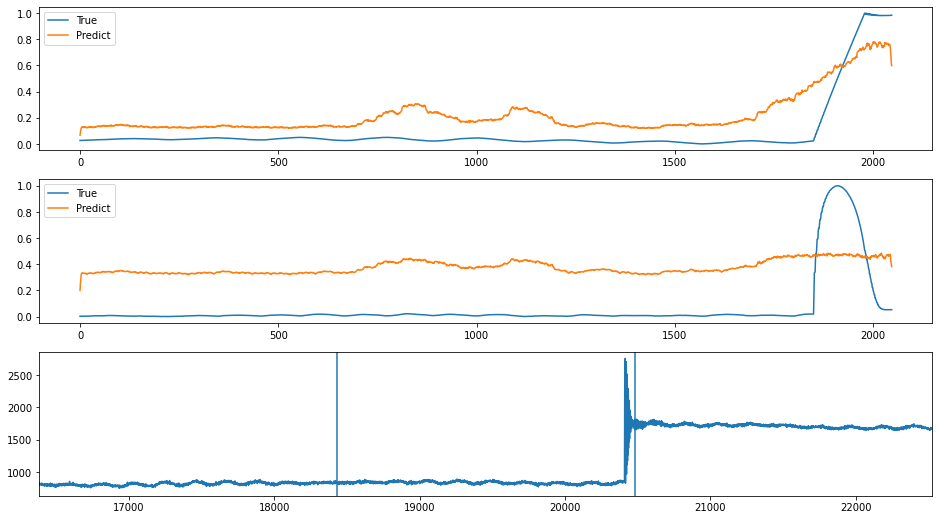

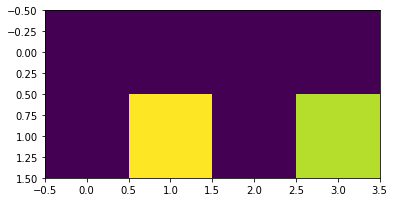

index: 55552
Error: 0.07983238978559731
type                                                         Inst
fill                                                         6760
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-05 15:54:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6760/...
n_bunches                                                     252
bunch_index                                                   105
bunch_number                                                   37
ts_length                                                   65536
chunk                                                          24
Name: 6200, dtype: object


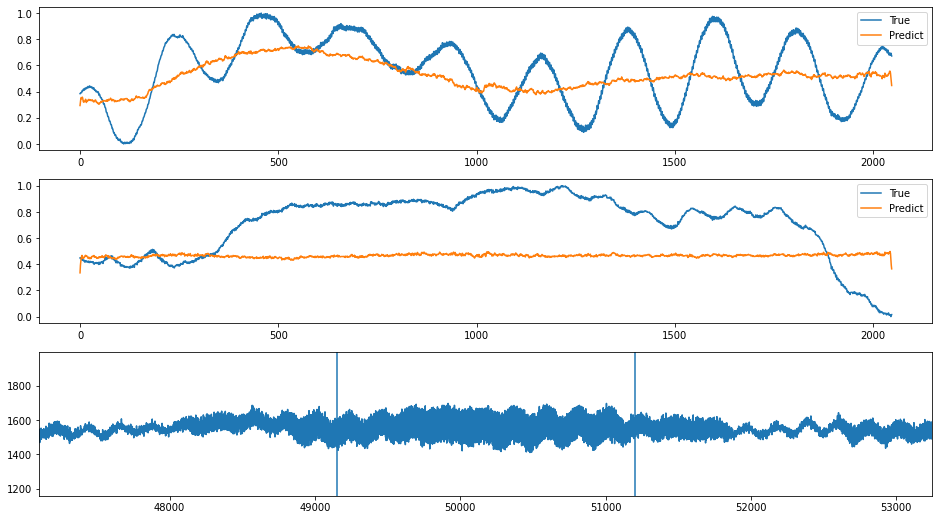

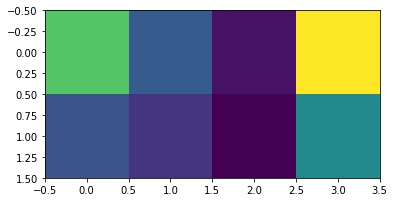

index: 312305
Error: 0.07978462203058247
type                                                         Inst
fill                                                         7470
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-24 09:56:03
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7470/...
n_bunches                                                     502
bunch_index                                                  2213
bunch_number                                                  465
ts_length                                                   65536
chunk                                                           9
Name: 2523, dtype: object


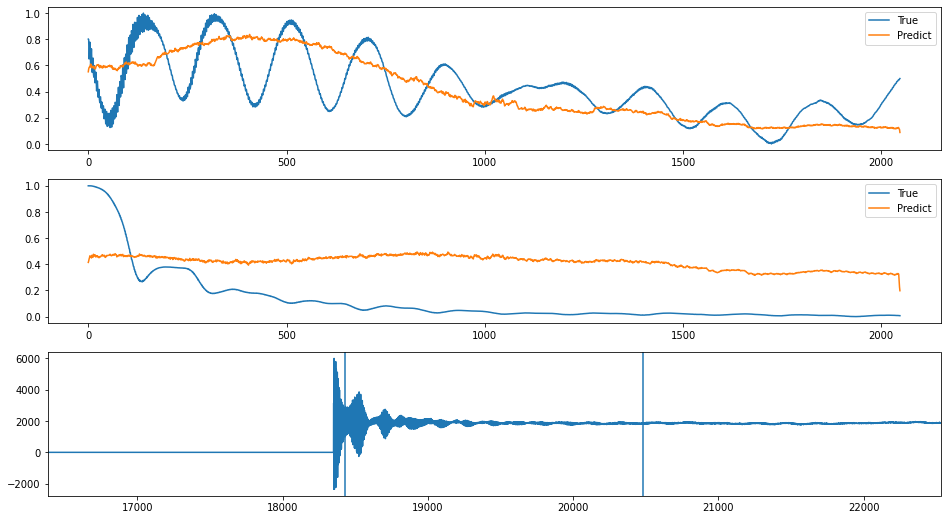

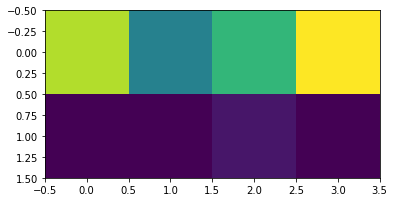

index: 65866
Error: 0.0797013521790792
type                                                         Inst
fill                                                         6859
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-28 13:39:16
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6859/...
n_bunches                                                     684
bunch_index                                                   907
bunch_number                                                  661
ts_length                                                   65536
chunk                                                           9
Name: 2509, dtype: object


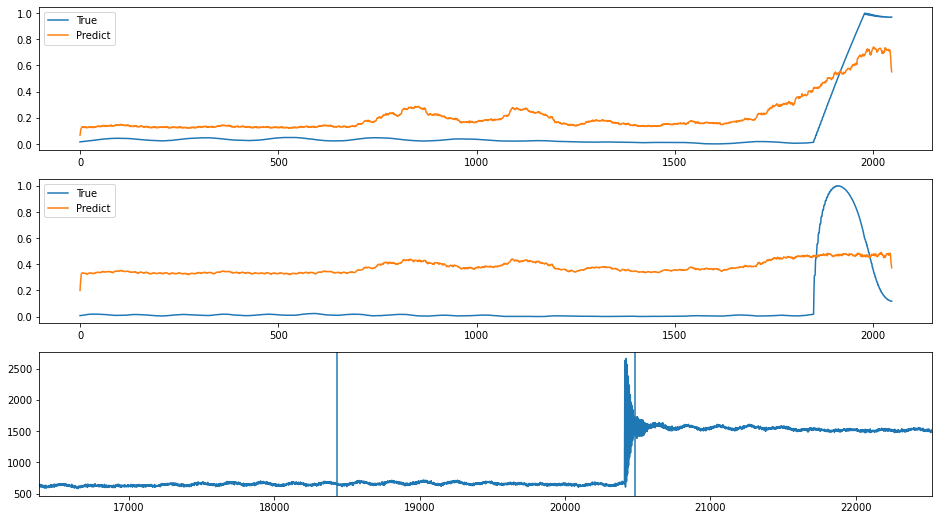

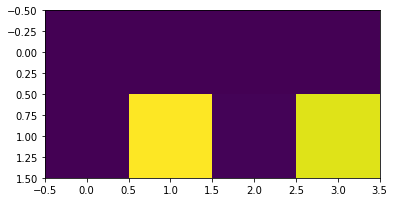

index: 206692
Error: 0.07967180626006772
type                                                         Inst
fill                                                         6990
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-27 10:03:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6990/...
n_bunches                                                     444
bunch_index                                                   418
bunch_number                                                  190
ts_length                                                   65536
chunk                                                           6
Name: 1751, dtype: object


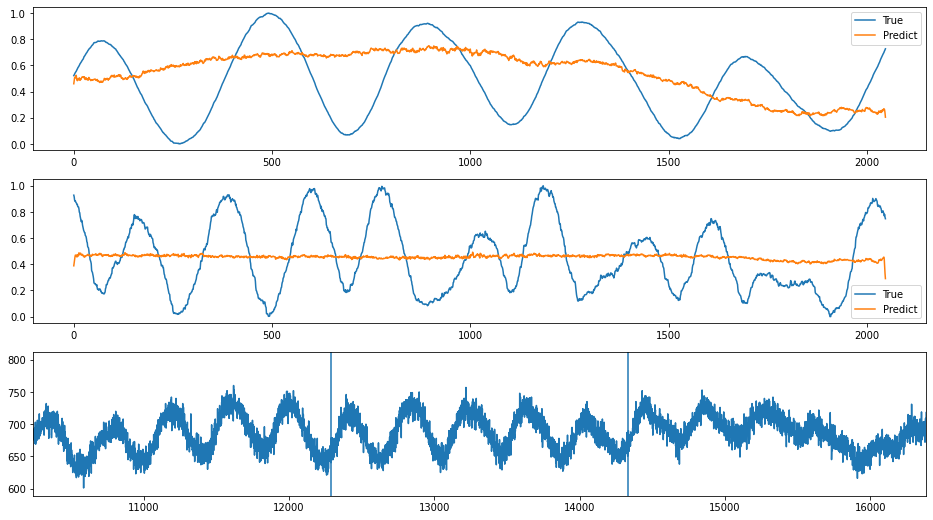

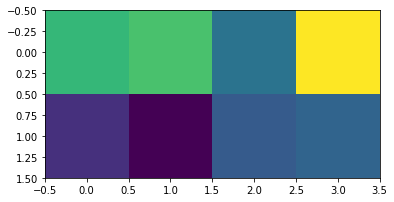

index: 194128
Error: 0.07964301315737932
type                                                         Inst
fill                                                         6404
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-21 17:11:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6404/...
n_bunches                                                     656
bunch_index                                                   552
bunch_number                                                  151
ts_length                                                   65536
chunk                                                          14
Name: 3742, dtype: object


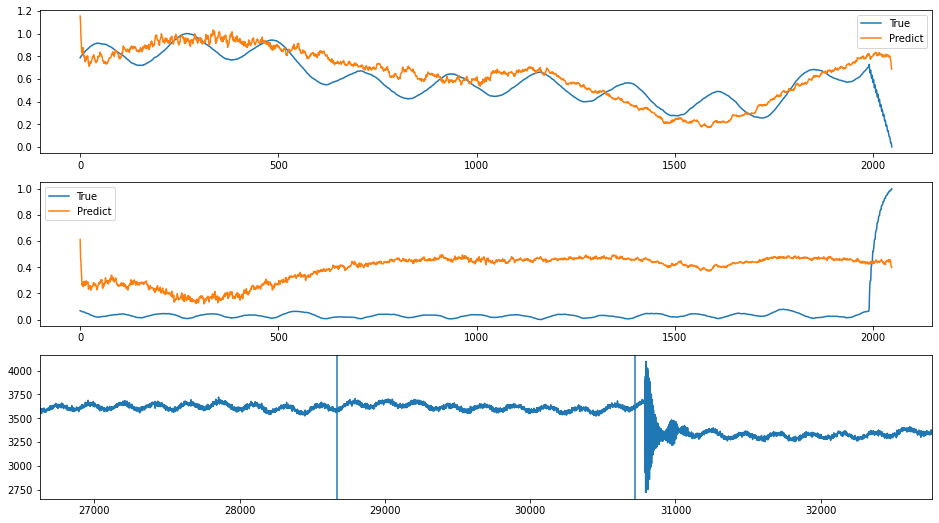

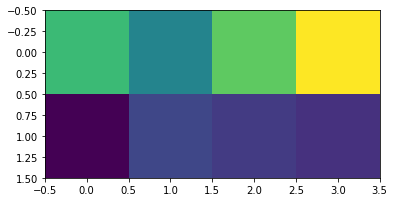

index: 28165
Error: 0.07962338957975348
type                                                         Inst
fill                                                         6394
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-16 17:38:25
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6394/...
n_bunches                                                     876
bunch_index                                                  1485
bunch_number                                                  769
ts_length                                                   65536
chunk                                                           5
Name: 1482, dtype: object


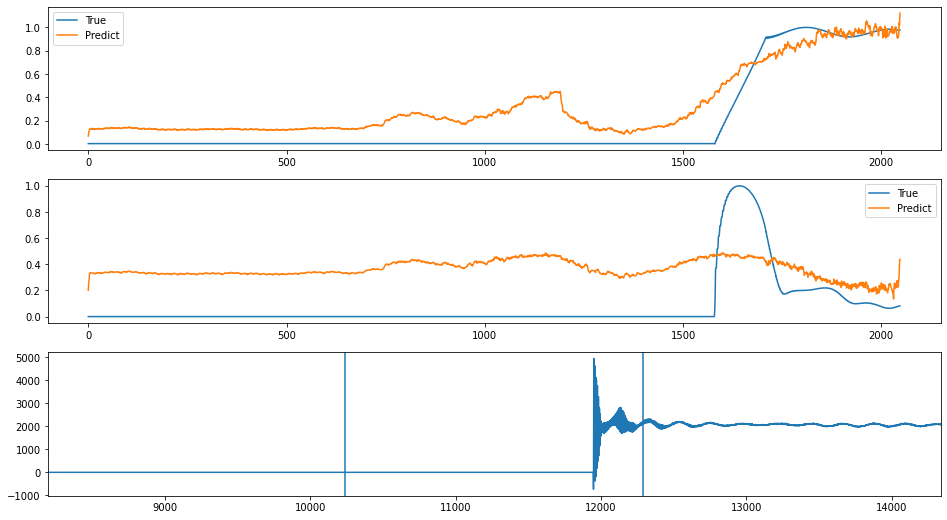

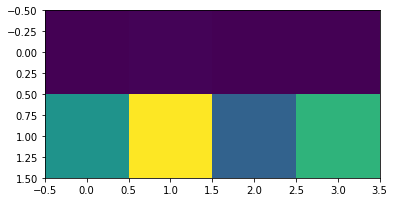

index: 186149
Error: 0.07949705783065006
type                                                         Inst
fill                                                         7315
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-10-18 16:43:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7315/...
n_bunches                                                     924
bunch_index                                                   140
bunch_number                                                   84
ts_length                                                   65536
chunk                                                          16
Name: 4252, dtype: object


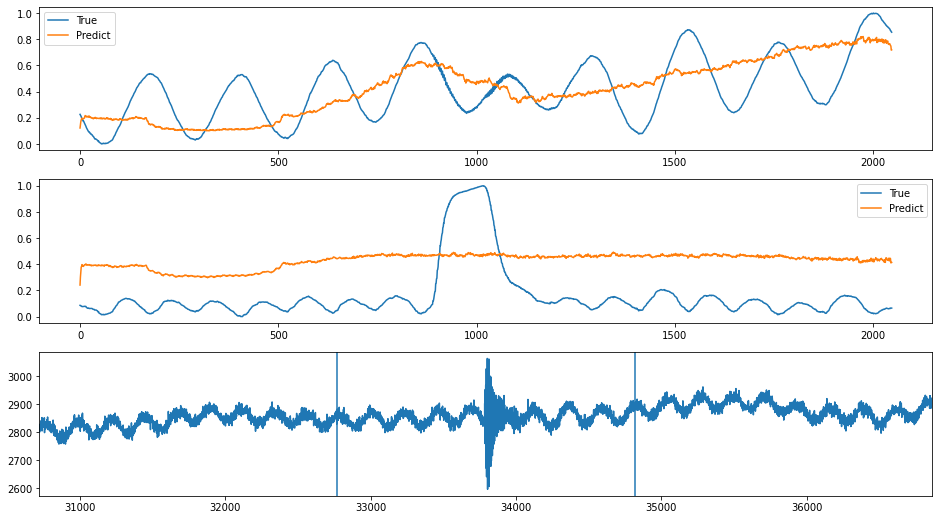

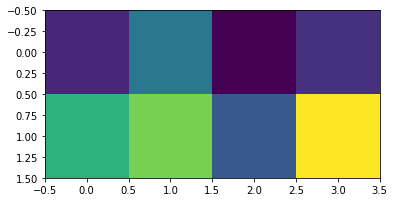

index: 61321
Error: 0.07941793903549839
type                                                         Inst
fill                                                         6760
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-05 15:54:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6760/...
n_bunches                                                     252
bunch_index                                                   105
bunch_number                                                   37
ts_length                                                   65536
chunk                                                          13
Name: 3384, dtype: object


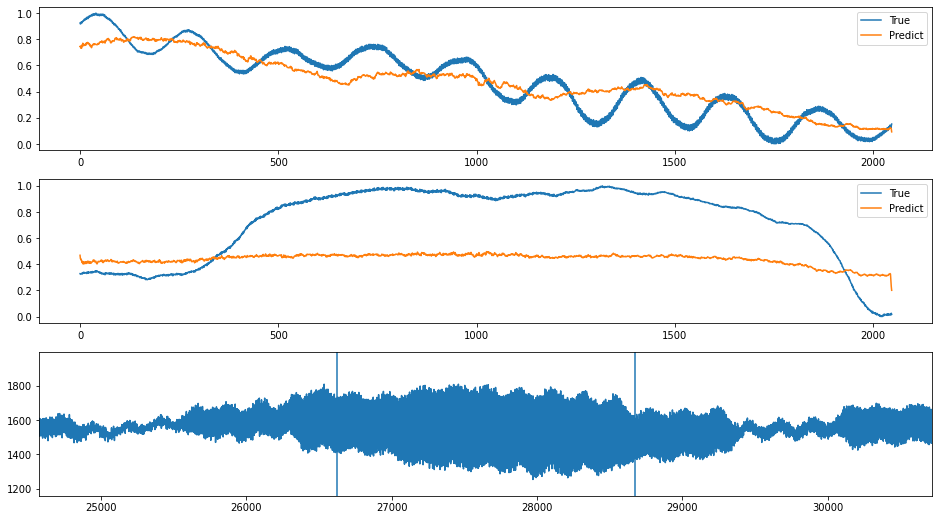

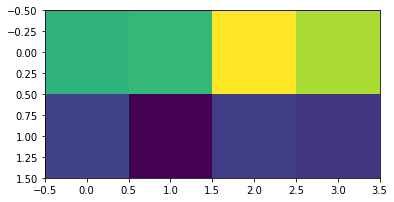

index: 117855
Error: 0.07913740759985391
type                                                         Inst
fill                                                         6797
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-06-15 00:44:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6797/...
n_bunches                                                     156
bunch_index                                                   227
bunch_number                                                   41
ts_length                                                   65536
chunk                                                          13
Name: 3434, dtype: object


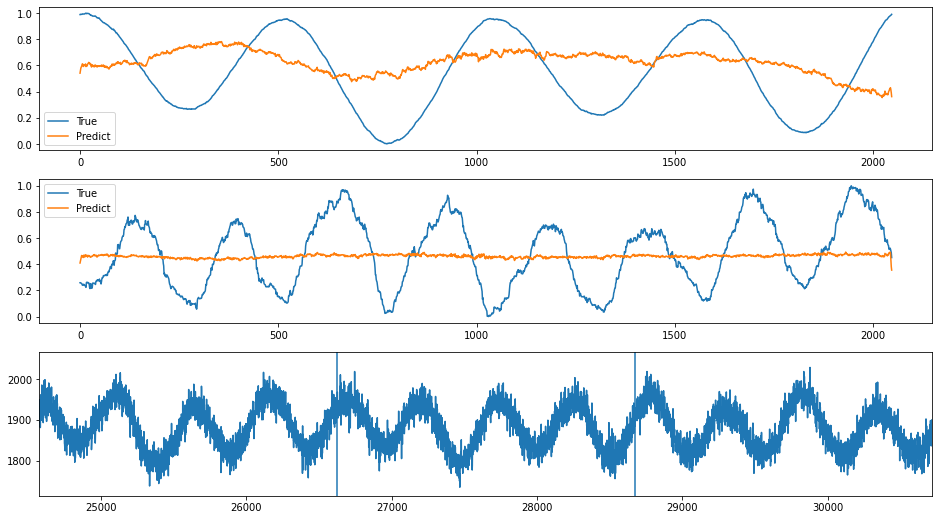

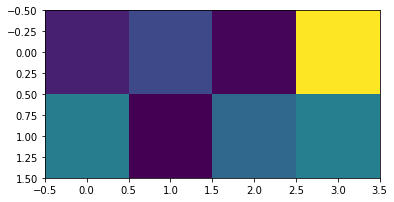

index: 244448
Error: 0.07907162536695844
type                                                         Inst
fill                                                         7059
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-17 21:37:49
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7059/...
n_bunches                                                     108
bunch_index                                                    69
bunch_number                                                   20
ts_length                                                   65536
chunk                                                          12
Name: 3221, dtype: object


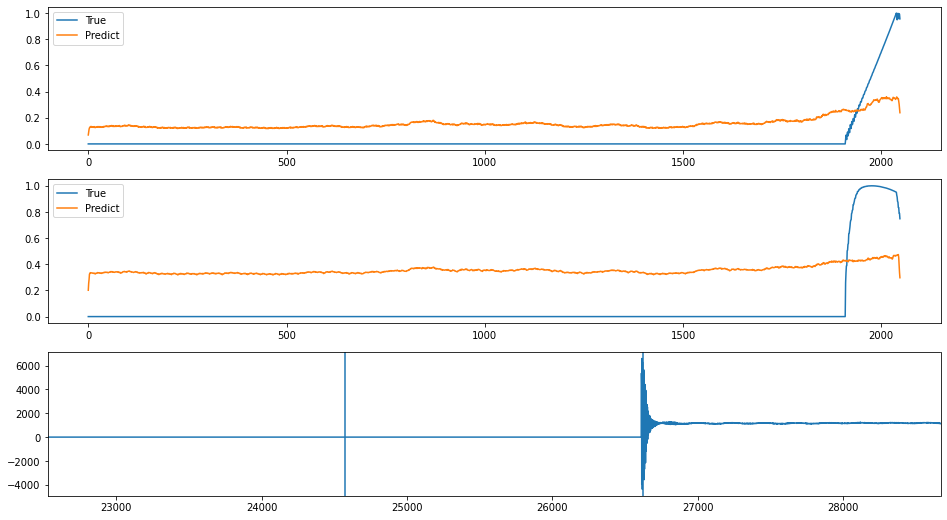

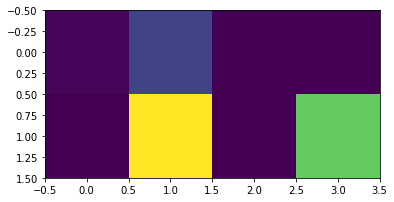

index: 52211
Error: 0.07850269183221253
type                                                         Inst
fill                                                         6666
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-10 21:57:08
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6666/...
n_bunches                                                     108
bunch_index                                                   155
bunch_number                                                   80
ts_length                                                   65536
chunk                                                          10
Name: 2760, dtype: object


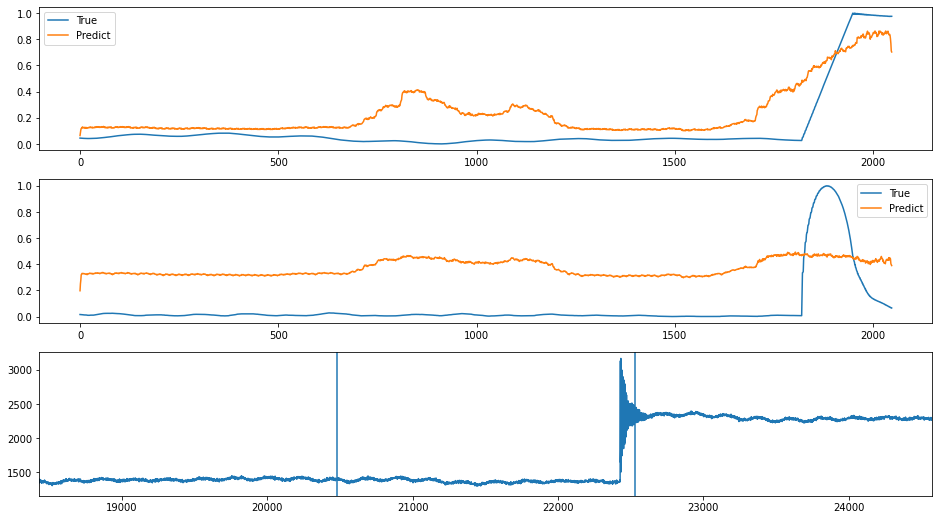

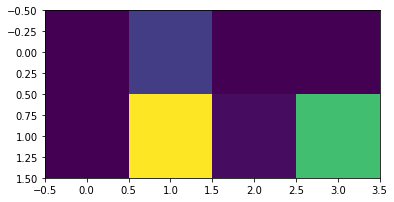

index: 338647
Error: 0.07838090472244202
type                                                         Inst
fill                                                         6659
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-09 00:18:56
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6659/...
n_bunches                                                     252
bunch_index                                                    95
bunch_number                                                   27
ts_length                                                   65536
chunk                                                           5
Name: 1447, dtype: object


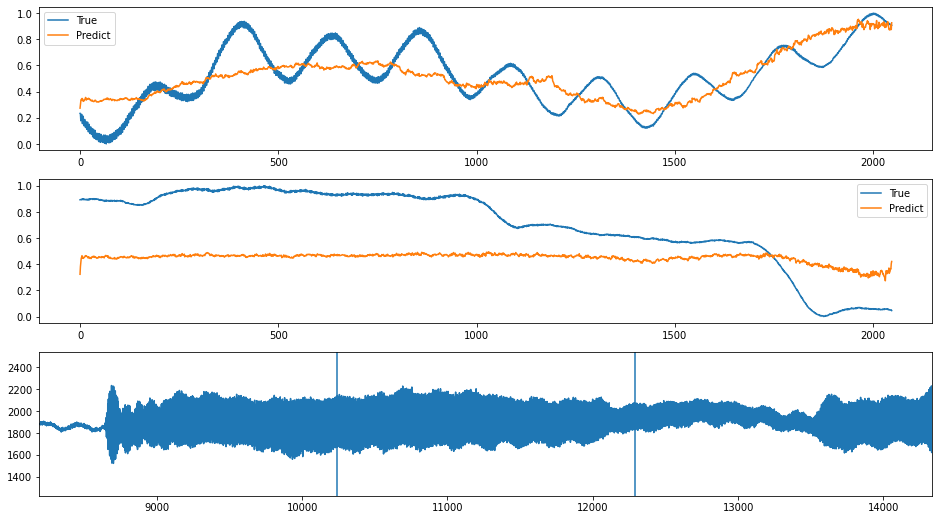

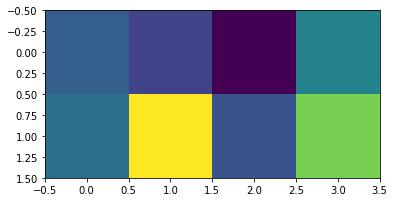

In [26]:
for i in range(1, 51):
    index = sorted_error_indices[-i]
    plot_train_index(index)

# Around the peak

In [27]:
error_around_peak = abs(train_error - hist_peak)
sorted_error_indices_around_peak = np.argsort(error_around_peak)

index: 30043
Error: 0.021605652416891972
type                                                         Inst
fill                                                         7427
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-08 23:53:15
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7427/...
n_bunches                                                      64
bunch_index                                                  1802
bunch_number                                                   33
ts_length                                                   65536
chunk                                                          14
Name: 3608, dtype: object


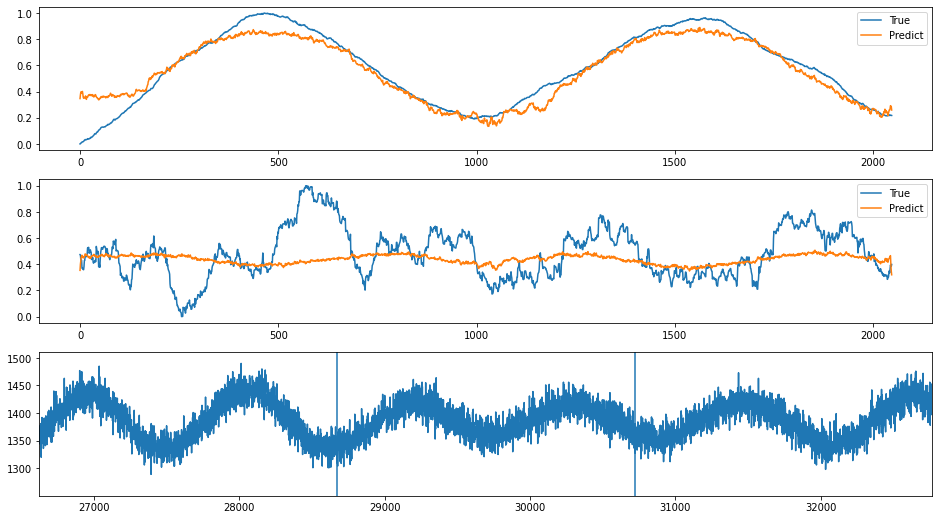

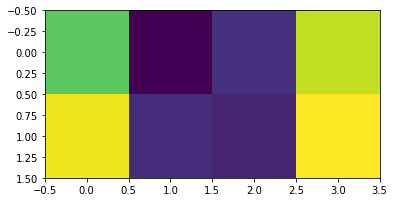

index: 133389
Error: 0.021605494136326432
type                                                         Inst
fill                                                         6919
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-07-13 13:52:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6919/...
n_bunches                                                    2556
bunch_index                                                   684
bunch_number                                                  493
ts_length                                                   65536
chunk                                                           0
Name: 141, dtype: object


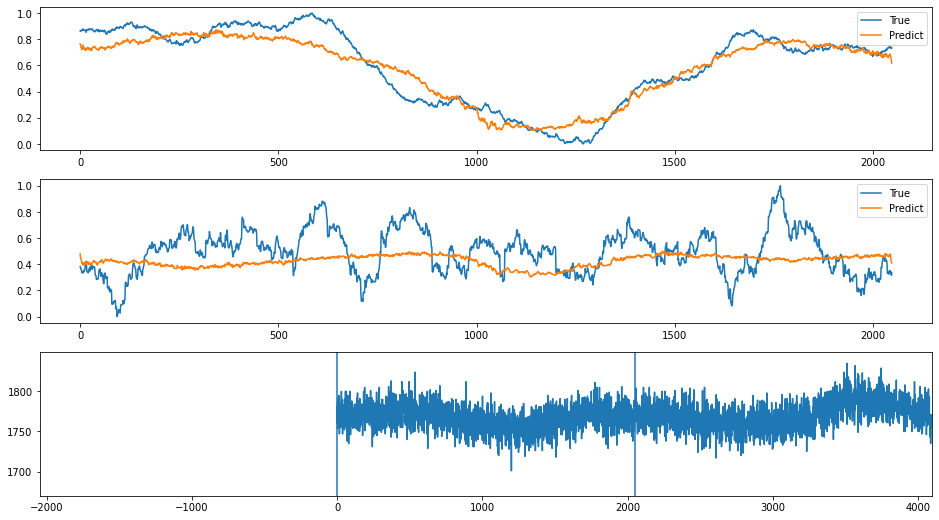

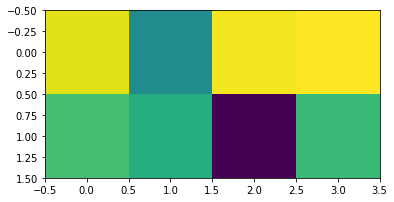

index: 106031
Error: 0.021605465970277266
type                                                         Inst
fill                                                         6255
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-09-29 08:01:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6255/...
n_bunches                                                    1916
bunch_index                                                  2756
bunch_number                                                 1519
ts_length                                                   65536
chunk                                                          26
Name: 6684, dtype: object


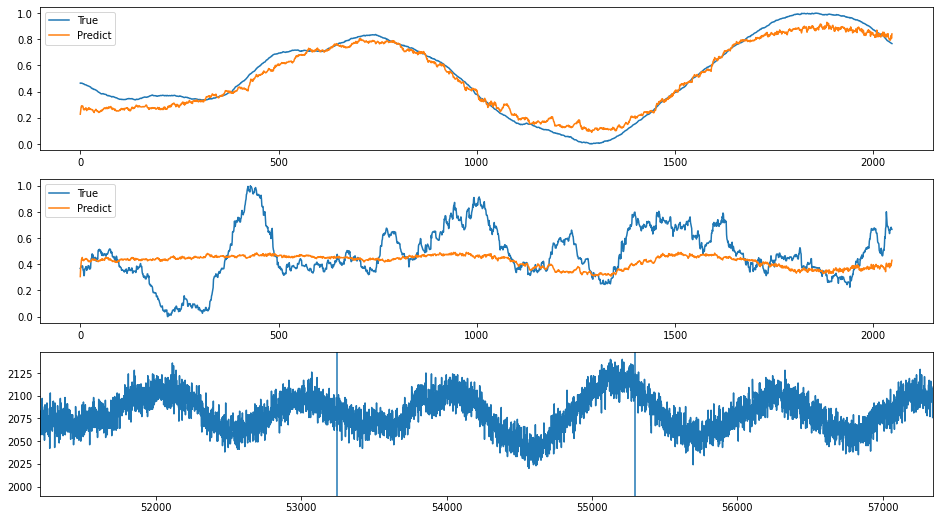

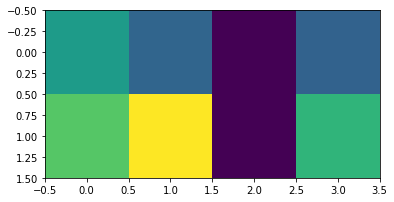

index: 241753
Error: 0.02160545620532013
type                                                         Inst
fill                                                         7464
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-11-22 03:42:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7464/...
n_bunches                                                     460
bunch_index                                                  1161
bunch_number                                                  119
ts_length                                                   65536
chunk                                                          30
Name: 7920, dtype: object


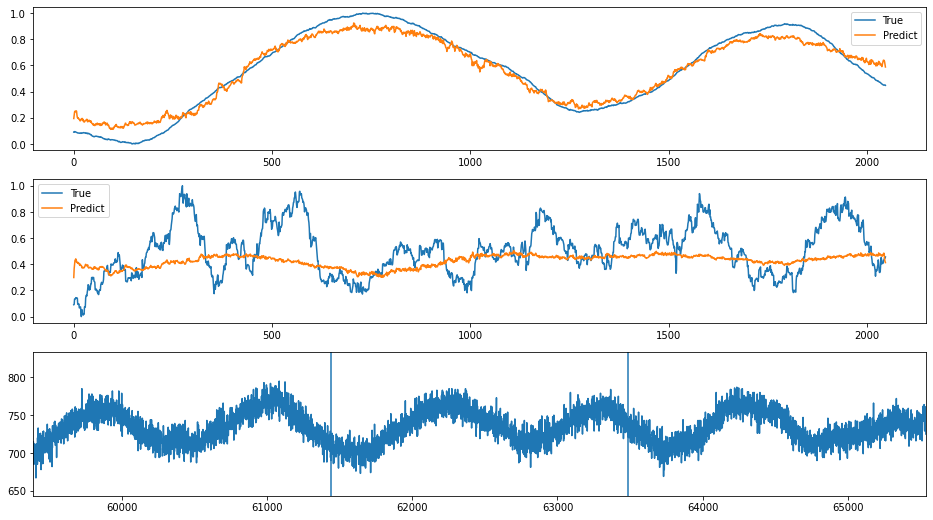

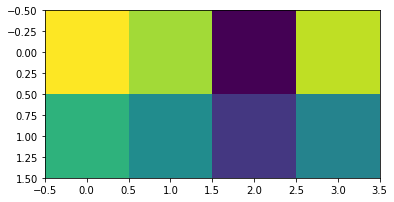

index: 141148
Error: 0.021605386181268466
type                                                         Inst
fill                                                         6694
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-17 11:56:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6694/...
n_bunches                                                    2175
bunch_index                                                  3184
bunch_number                                                 2081
ts_length                                                   65536
chunk                                                           6
Name: 1692, dtype: object


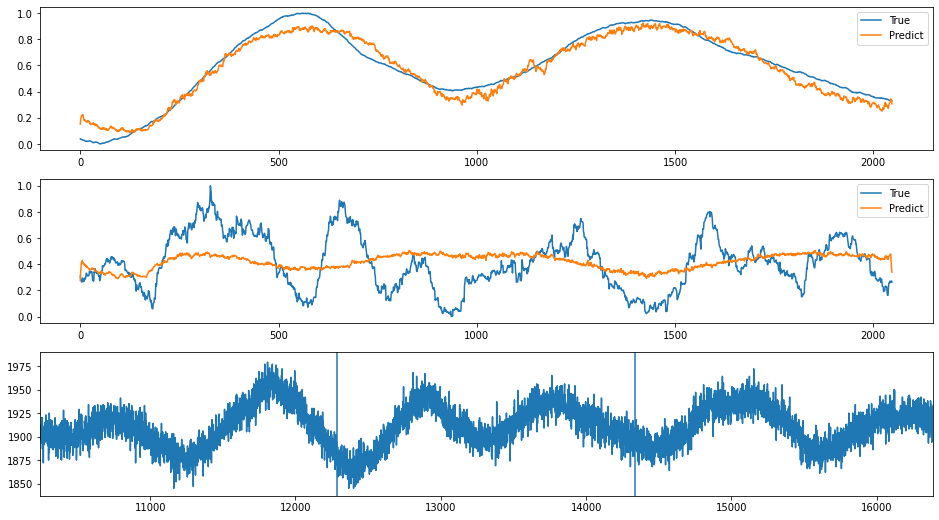

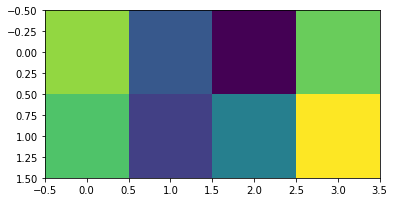

index: 348466
Error: 0.02160530613246007
type                                                         Inst
fill                                                         6693
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-17 03:36:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6693/...
n_bunches                                                    1887
bunch_index                                                  2293
bunch_number                                                 1322
ts_length                                                   65536
chunk                                                          28
Name: 7252, dtype: object


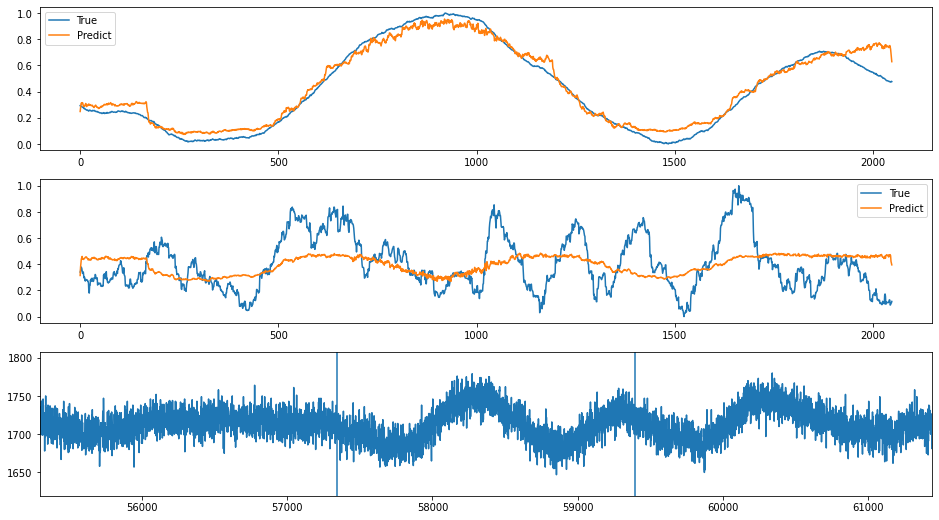

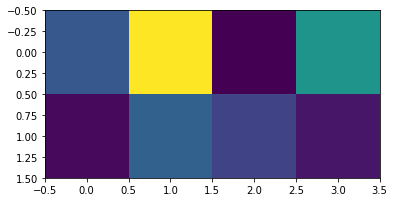

index: 119201
Error: 0.021605884527254152
type                                                         Inst
fill                                                         6650
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-07 12:36:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6650/...
n_bunches                                                    2556
bunch_index                                                  2644
bunch_number                                                 1948
ts_length                                                   65536
chunk                                                           1
Name: 373, dtype: object


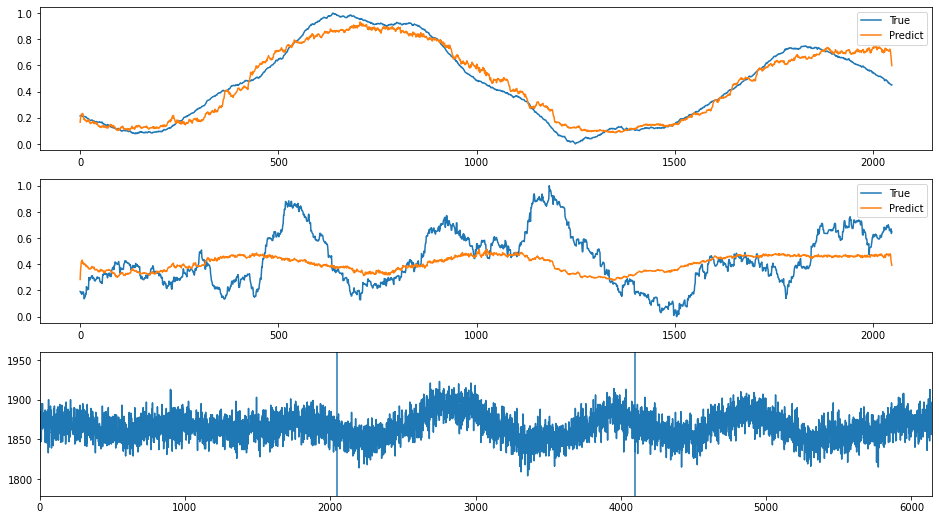

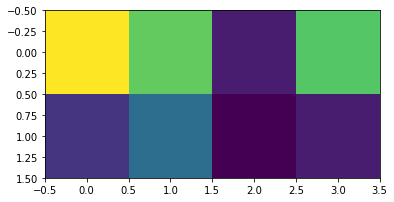

index: 91532
Error: 0.02160527257037385
type                                                         Inst
fill                                                         6688
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-05-15 19:02:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6688/...
n_bunches                                                     987
bunch_index                                                   479
bunch_number                                                  145
ts_length                                                   65536
chunk                                                           0
Name: 113, dtype: object


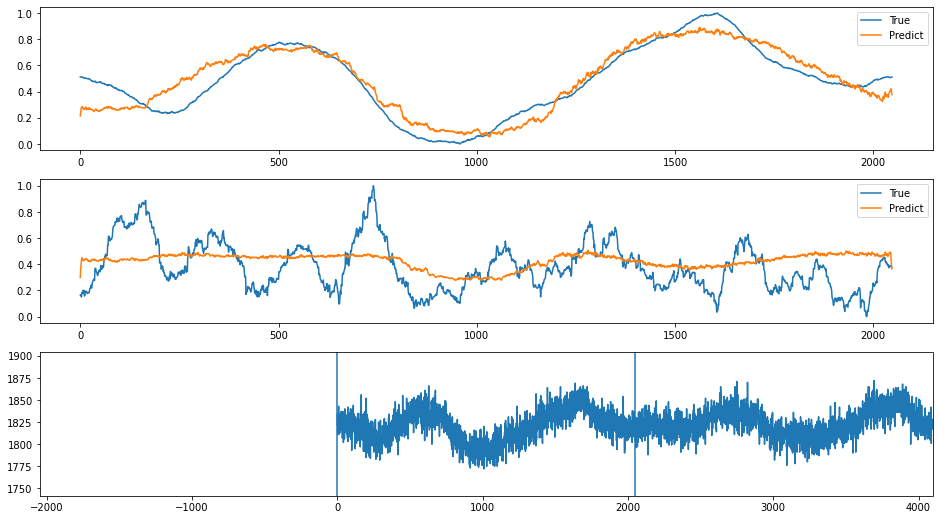

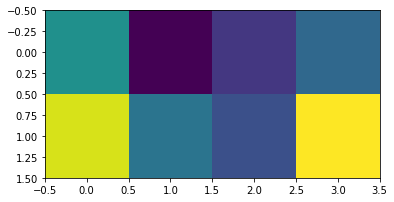

index: 288489
Error: 0.021605906436023066
type                                                         Inst
fill                                                         7033
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2018-08-07 11:47:14
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/7033/...
n_bunches                                                    2556
bunch_index                                                  3071
bunch_number                                                 2273
ts_length                                                   65536
chunk                                                          27
Name: 7036, dtype: object


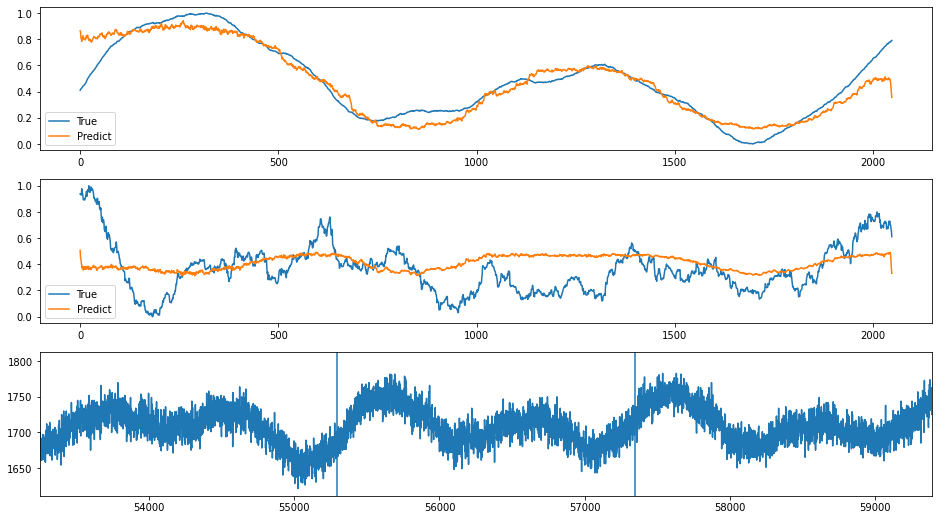

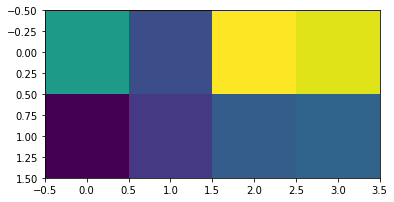

index: 294989
Error: 0.021605918168338463
type                                                         Inst
fill                                                         6392
beam                                                            1
plane                                                           h
q                                                               7
date_time                                     2017-11-16 07:52:13
file            /nfs/cs-ccr-adtobsnfs/lhc_adtobsbox_data/6392/...
n_bunches                                                    1836
bunch_index                                                  1782
bunch_number                                                  921
ts_length                                                   65536
chunk                                                          15
Name: 4031, dtype: object


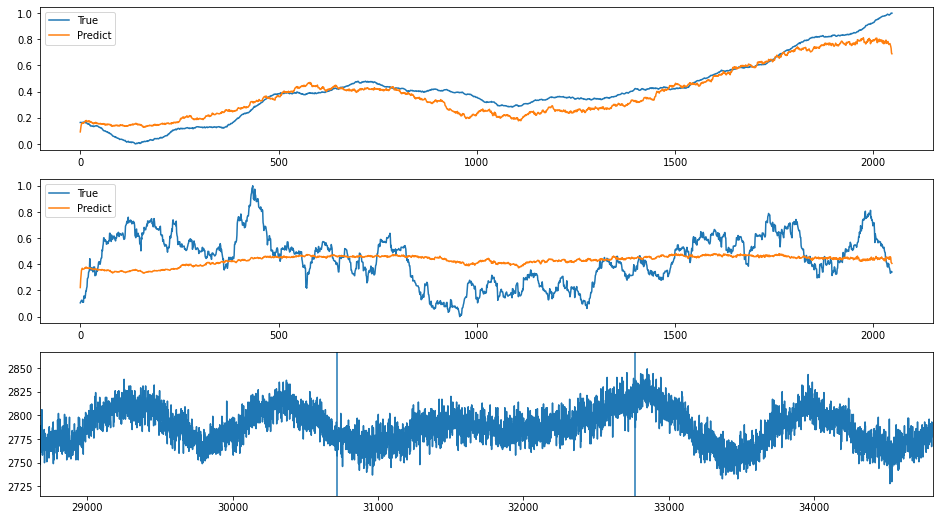

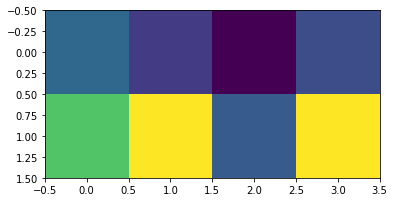

In [28]:
for i in range(10):
    index = sorted_error_indices_around_peak[i]
    plot_train_index(index)

# Around a point

In [29]:
# point = 

In [30]:
# error_around_peak = abs(train_error - point)
# sorted_error_indices_around_point = np.argsort(error_around_peak)

In [31]:
# for i in range(10):
#     index = sorted_error_indices_around_point[i]
#     plot_train_index(index)

# Clustering

In [32]:
indices = sorted_error_indices[-np.arange(1, 1024+1)]
encoding_true = train_data[indices]
encoding_pred = train_prediction[indices]
encoding_meta = train_meta.iloc[indices]
try:
    encoded = checker.encode(encoding_true)
except:
    encoded = np.array(checker.encoder(encoding_true)).squeeze()
encoded_2d = encoded.reshape(encoded.shape[0], -1)

In [33]:
encoded_2d.shape

(1024, 8)

In [34]:
print(encoded_2d[0])

[3.583626  8.063678  0.6761653 5.481582  5.7419467 7.438741  7.6140375
 8.544134 ]


In [35]:
encoded_2d.min()

0.0

In [36]:
encoded_2d.max()

35.187202

In [37]:
def plot_clusters(cluster_indices):
    print(f"N samples: {len(cluster_indices)}")
    fig, axes = plt.subplots(encoding_true.shape[2], 1, figsize=(12, 3))
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    for i in range(encoding_true.shape[2]):
        axes[i].plot(encoding_true[cluster_indices][:,:, i].T, linewidth=0, marker=',', alpha=0.1)
    return fig, axes

def plot_avg_encoding(cluster_indices):
    plt.imshow(encoded[cluster_indices].mean(axis=0))

In [38]:
import sklearn
from sklearn.manifold import TSNE

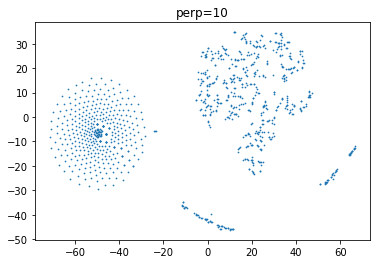

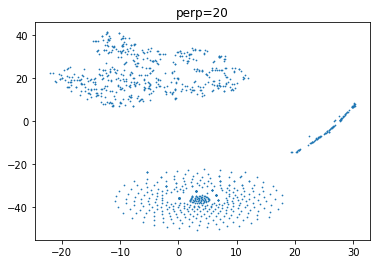

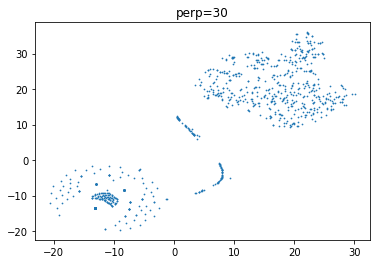

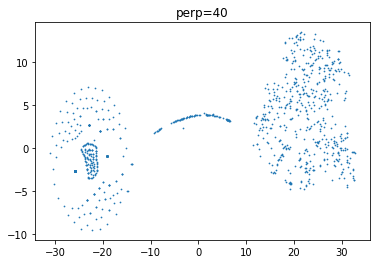

In [39]:
for perplexity in [10, 20, 30, 40]:
    tsne = TSNE(perplexity=perplexity)
    encoded_2d_tsne = tsne.fit_transform(encoded_2d)
    plt.scatter(encoded_2d_tsne[:, 0], encoded_2d_tsne[:, 1], marker='.', s=2)
    plt.title(f"perp={perplexity}")
    plt.show()

In [40]:
tsne = TSNE(perplexity=30)
encoded_2d_tsne = tsne.fit_transform(encoded_2d)

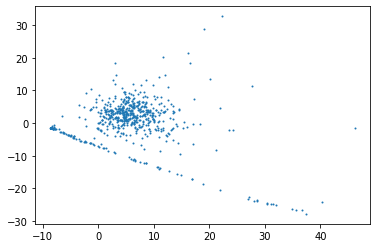

In [41]:
from sklearn.decomposition import PCA

pca = PCA(n_components=8)
encoded_2d_pca = pca.fit_transform(encoded_2d)
plt.scatter(encoded_2d_pca[:, 0], encoded_2d_pca[:, 1], marker='.', s=4)

In [42]:
pca.explained_variance_ratio_.sum()

0.99999994

In [43]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import matplotlib as mpl
mpl.style.use("default")

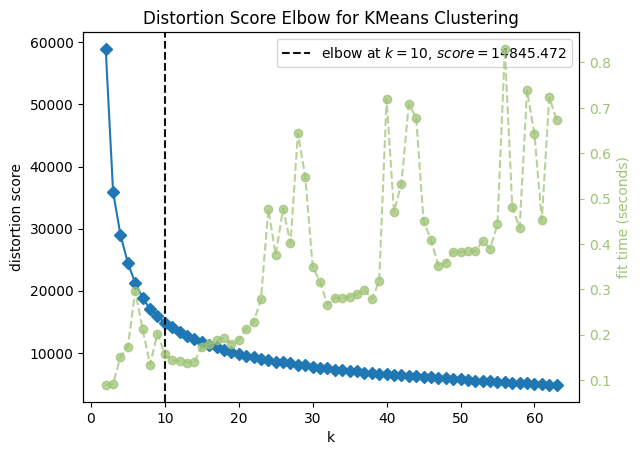

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [47]:
kmeans = KMeans()
viz = KElbowVisualizer(kmeans, k=(2, 64))
viz.fit(encoded_2d)
viz.show()

-------------
n_clusters: 10
cluster 0
N samples: 151


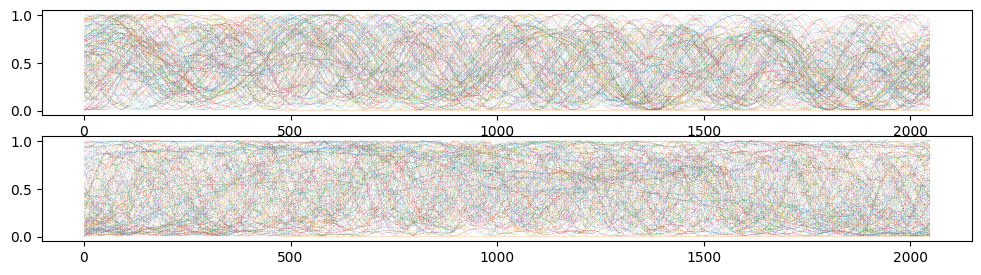

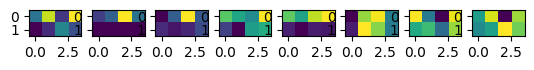

cluster 1
N samples: 450


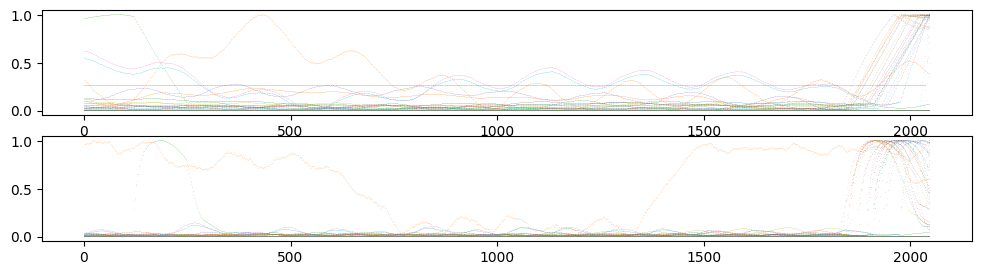

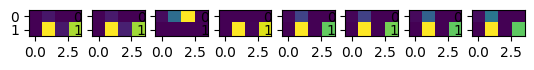

cluster 2
N samples: 17


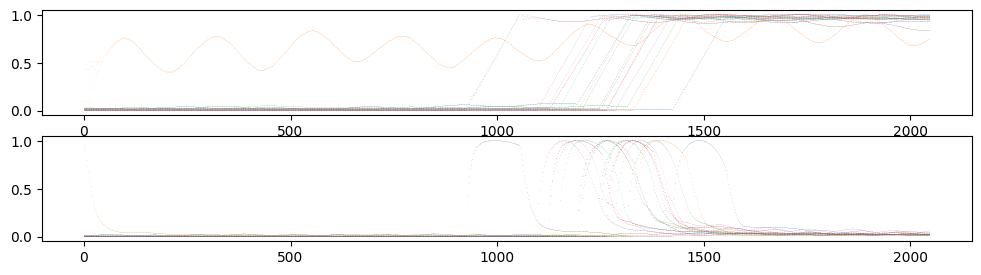

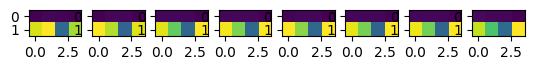

cluster 3
N samples: 72


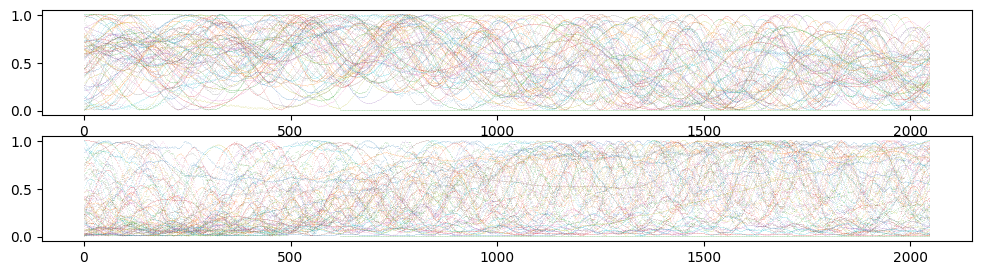

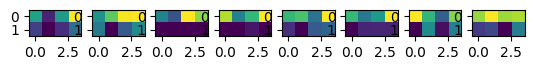

cluster 4
N samples: 109


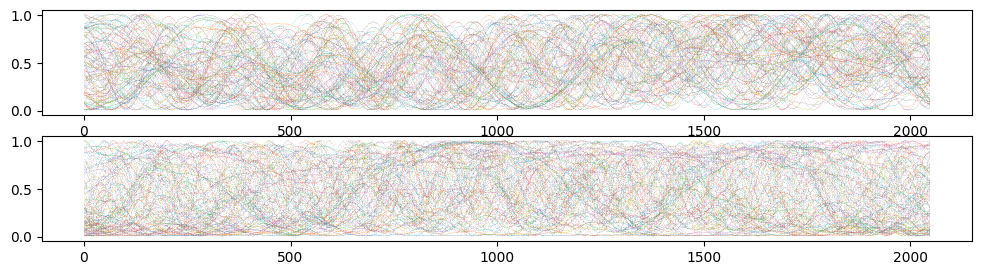

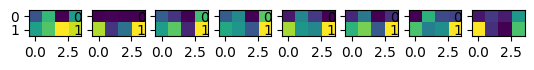

cluster 5
N samples: 40


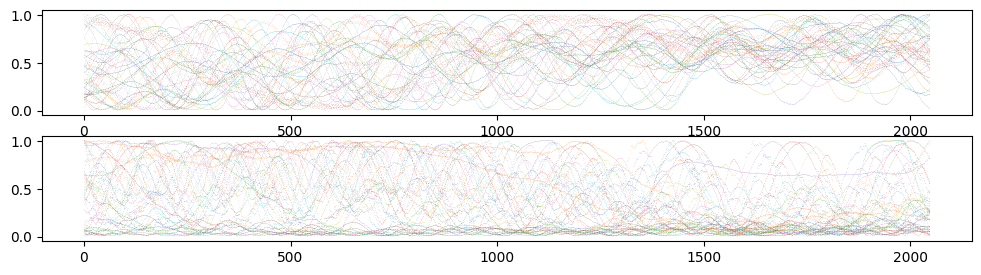

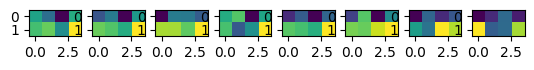

cluster 6
N samples: 23


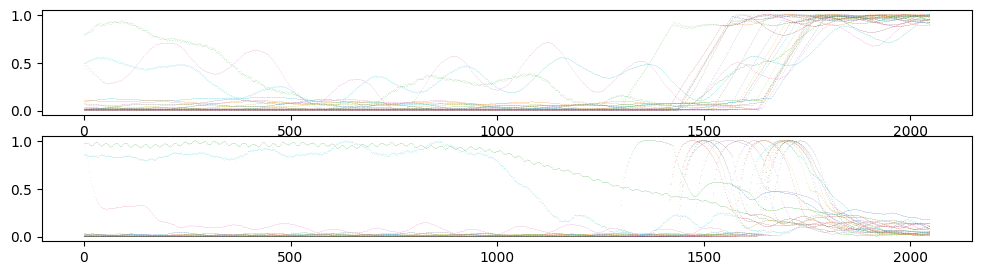

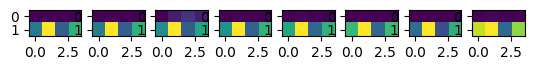

cluster 7
N samples: 8


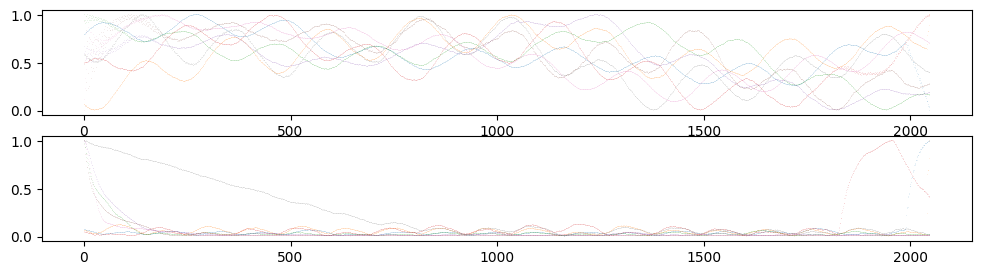

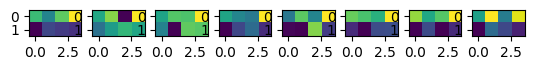

cluster 8
N samples: 120


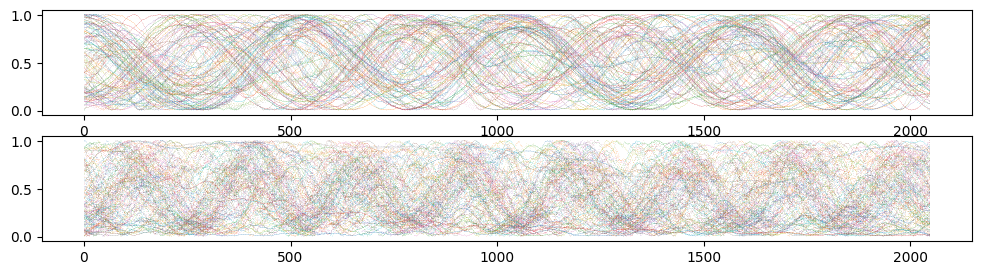

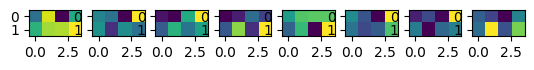

cluster 9
N samples: 34


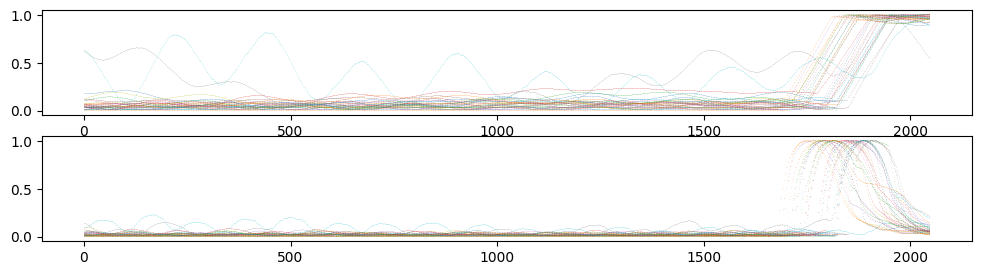

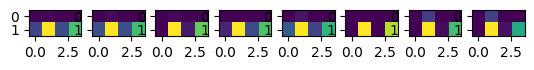

In [50]:
kmeans = KMeans(n_clusters=viz.elbow_value_)
clustering = kmeans.fit(encoded_2d)
print('-------------')
print("n_clusters:", viz.elbow_value_)
for cluster in np.unique(clustering.labels_):
    cluster_indices = np.where(clustering.labels_ == cluster)[0]
    print("cluster", cluster)
    fig, axes = plot_clusters(cluster_indices)
    plt.show()
    
    n_imgs = min(8, len(cluster_indices))
    fig, axes = plt.subplots(1, n_imgs)
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    for i, img in enumerate(encoded[cluster_indices][:n_imgs]):
        axes[i].imshow(img)
    plt.show()